# Reading the datasets

## Temperature

In [ ]:
import pandas as pd

temperature_df = pd.read_csv('/kaggle/input/engineering-datasets/monthly-average-surface-temperatures-by-year.csv')
print("\nprinting head:\n",temperature_df.head())


printing head:
         Entity Code  Year       2025       2024       2023       2022  \
0  Afghanistan  AFG     1  -1.812812   3.300064  -4.335608  -0.322859   
1  Afghanistan  AFG     2   1.728558   1.024550   4.187041   2.165870   
2  Afghanistan  AFG     3   6.922349   5.843506  10.105444  10.483686   
3  Afghanistan  AFG     4  16.707405  11.627398  14.277164  17.227650   
4  Afghanistan  AFG     5  21.536873  18.957850  19.078170  19.962734   

        2021       2020       2019  ...       1959       1958       1956  \
0  -1.001608  -2.560545   0.585145  ...  -2.333814   0.576404  -3.351925   
1   5.688000   2.880046   0.068664  ...  -1.545529   0.264962   0.455350   
2   9.777976   6.916731   5.758049  ...   5.942937   7.716459   5.090270   
3  15.168276  12.686832  13.838840  ...  13.752827  14.712909  11.982360   
4  19.885902  18.884047  18.461287  ...  17.388723  16.352045  20.125462   

        1954       1952       1957       1955       1953       1951       1950  
0  -2.

fixing the dataframe

In [ ]:
temperature_df.info

<bound method DataFrame.info of            Entity Code  Year       2025       2024       2023       2022  \
0     Afghanistan  AFG     1  -1.812812   3.300064  -4.335608  -0.322859   
1     Afghanistan  AFG     2   1.728558   1.024550   4.187041   2.165870   
2     Afghanistan  AFG     3   6.922349   5.843506  10.105444  10.483686   
3     Afghanistan  AFG     4  16.707405  11.627398  14.277164  17.227650   
4     Afghanistan  AFG     5  21.536873  18.957850  19.078170  19.962734   
...           ...  ...   ...        ...        ...        ...        ...   
2551     Zimbabwe  ZWE     8  19.531837  20.559408  19.403421  19.753540   
2552     Zimbabwe  ZWE     9  24.193079  23.642931  24.119785  22.904700   
2553     Zimbabwe  ZWE    10  25.237411  24.407030  25.584270  26.157349   
2554     Zimbabwe  ZWE    11        NaN  25.672321  26.318169  23.657791   
2555     Zimbabwe  ZWE    12        NaN  27.019161  25.221447  24.016981   

           2021       2020       2019  ...       1959  

In [ ]:
#renaming the year column to month, because it has the months not years
temperature_df.rename(columns={'Year': 'Month', 'Entity':'Country'}, inplace=True)

#since each year is it own column i will use the .melt() function
#to reshape the dataframe
fixed_cols = ['Country', 'Code', 'Month']
#making a list with the cols not in fixed_cols
#too many cols so i used a loop
changing_cols = [col for col in temperature_df.columns if col not in fixed_cols]

temperature_df = temperature_df.melt(id_vars=fixed_cols,
                     value_vars=changing_cols,
                     var_name='Year',
                     value_name='Temperature')

In [ ]:
temperature_df.head()

,Country,Code,Month,Year,Temperature
0,Afghanistan,AFG,1,2025,-1.812812
1,Afghanistan,AFG,2,2025,1.728558
2,Afghanistan,AFG,3,2025,6.922349
3,Afghanistan,AFG,4,2025,16.707405
4,Afghanistan,AFG,5,2025,21.536873


In [ ]:
print(temperature_df.shape)
temperature_df.info()

(194256, 5)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 194256 entries, 0 to 194255
Data columns (total 5 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Country      194256 non-null  object 
 1   Code         177840 non-null  object 
 2   Month        194256 non-null  int64  
 3   Year         194256 non-null  object 
 4   Temperature  193830 non-null  float64
dtypes: float64(1), int64(1), object(3)
memory usage: 7.4+ MB


In [ ]:
#the year is an object type after the melt function, so changing it to int
temperature_df['Year'] = temperature_df['Year'].astype(int)

dropping duplicates

In [ ]:
temperature_df.drop_duplicates()
temperature_df.shape

(194256, 5)

checking nan

In [ ]:
temperature_df.isnull().sum()

Country            0
Code           16416
Month              0
Year               0
Temperature      426
dtype: int64

In [ ]:

temp_nan = temperature_df[temperature_df['Temperature'].isnull()]
print("\nprinting temperature nan:\n",temp_nan)


printing temperature nan:
              Country Code  Month  Year  Temperature
10       Afghanistan  AFG     11  2025          NaN
11       Afghanistan  AFG     12  2025          NaN
22    Africa (NIAID)  NaN     11  2025          NaN
23    Africa (NIAID)  NaN     12  2025          NaN
34           Albania  ALB     11  2025          NaN
...              ...  ...    ...   ...          ...
2531           Yemen  YEM     12  2025          NaN
2542          Zambia  ZMB     11  2025          NaN
2543          Zambia  ZMB     12  2025          NaN
2554        Zimbabwe  ZWE     11  2025          NaN
2555        Zimbabwe  ZWE     12  2025          NaN

[426 rows x 5 columns]


looks like the nan in temperature is for dates that have not yet been recorded
will check that case, and if true will drop them accordingly

In [ ]:
# it looks like the NaNs are only in the year 2025 for months 11/12
print('printing unique years/months for the nan in temperature:')
print(temp_nan['Year'].unique())
print(temp_nan['Month'].unique())
#the nan values are the 11,12 months in the year 2025 which have not yet been recorded
#safe to remove the nan rows

printing unique years/months for the nan in temperature:
[2025]
[11 12]


In [ ]:
temperature_df.dropna(subset=['Temperature'], inplace=True)

In [ ]:
code_nan = temperature_df[temperature_df['Code'].isnull()]
#it looks like the NaN are from the region entities like continents which do not have a code
# to check i will run the following code

print(code_nan['Country'].unique())

#it looks like the NaN are from the region entities that are continents only

['Africa (NIAID)' 'Antarctica (NIAID)' 'Arctic Ocean (NIAID)'
 'Asia (NIAID)' 'Australia (NIAID)' 'Baltic Sea (NIAID)' 'Europe (NIAID)'
 'Indian Ocean (NIAID' 'Mediterranean Region (NIAID)'
 'North America (NIAID)' 'North Atlantic Ocean (NIAID)'
 'North Pacific Ocean (NIAID)' 'Oceania (NIAID)' 'South America (NIAID)'
 'South Atlantic Ocean (NIAID)'
 'South China and Easter Archipelagic Seas (NIAID)'
 'South Pacific Ocean (NIAID)' 'Southern Ocean (NIAID)']


In [ ]:
temperature_df.isna().sum()

Country            0
Code           16380
Month              0
Year               0
Temperature        0
dtype: int64

In [ ]:
temperature_df.dropna(subset=['Code'], inplace=True)

In [ ]:
temperature_df.isna().sum()


Country        0
Code           0
Month          0
Year           0
Temperature    0
dtype: int64

In [ ]:
#i will specify the regions from Entity that have NIAID (territories/continents)
#and if they have NaN in the Code column they will be dropped
clean_code = temperature_df[temperature_df['Country'].str.contains("(NIAID)", regex=False, na=False)].dropna()
print("\nprinting the regions from the Entity column that have a value in the Code column;\n",clean_code)
#since the result is an empty df that means that all the regions do not have a code
# it is possible that we can drop the Code column but we'll see how we might use it later

print(temperature_df.head())


printing the regions from the Entity column that have a value in the Code column;
 Empty DataFrame
Columns: [Country, Code, Month, Year, Temperature]
Index: []
       Country Code  Month  Year  Temperature
0  Afghanistan  AFG      1  2025    -1.812812
1  Afghanistan  AFG      2  2025     1.728558
2  Afghanistan  AFG      3  2025     6.922349
3  Afghanistan  AFG      4  2025    16.707405
4  Afghanistan  AFG      5  2025    21.536873


In [ ]:
temperature_df = temperature_df.sort_values(by=['Country', 'Year', 'Month']).reset_index(drop=True)

In [ ]:
!pip install country-converter
import country_converter as coco

cc = coco.CountryConverter()

value_to_keep = "World"
mask = temperature_df["Country"] != value_to_keep

temperature_df.loc[mask, "Country"] = cc.convert(
    names=temperature_df.loc[mask, "Country"],
    to="name_short"
)

print(temperature_df.head())

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.5/47.5 kB 1.7 MB/s eta 0:00:00
       Country Code  Month  Year  Temperature
0  Afghanistan  AFG      1  1950    -2.655707
1  Afghanistan  AFG      2  1950    -3.996040
2  Afghanistan  AFG      3  1950     3.491112
3  Afghanistan  AFG      4  1950     8.332797
4  Afghanistan  AFG      5  1950    17.329062


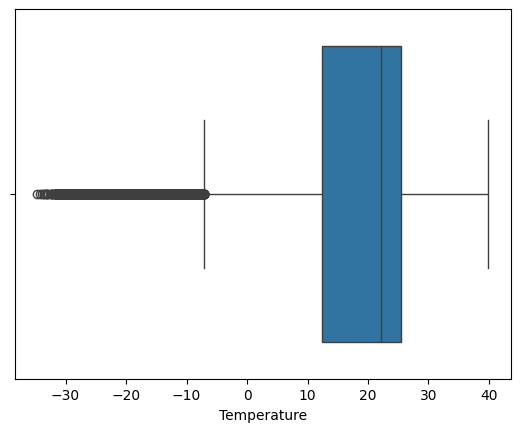

In [ ]:

#outliers
#======================================================================================
import seaborn as sns
import matplotlib.pyplot as plt

# Checking for temperature outliers
sns.boxplot(x=temperature_df['Temperature'])
plt.show()

#found outliers but since this is temperature data it is expected
#will check the type of outliers
import plotly.express as px

fig = px.scatter(temperature_df, x='Year', y='Temperature', color='Country',
                 title="Temperature vs Year (Hover to see Country)")
fig.show()
#the outliers seem to be in range for expected temperatures so i will not remove them

#==========================================================================================

## Percepitation

In [ ]:
import pandas as pd
from jupyter_core.migrate import regex

percipitation_df = pd.read_csv('/kaggle/input/engineering-datasets/average-precipitation-per-year.csv')

print(percipitation_df.head())

        Entity Code  Year  Annual precipitation
0  Afghanistan  AFG  1940             217.67816
1  Afghanistan  AFG  1941             196.80933
2  Afghanistan  AFG  1942             300.08905
3  Afghanistan  AFG  1943             345.60892
4  Afghanistan  AFG  1944             324.44350


checking dataset nature

In [ ]:
print(percipitation_df.shape)
percipitation_df.info()

(16575, 4)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16575 entries, 0 to 16574
Data columns (total 4 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Entity                16575 non-null  object 
 1   Code                  16490 non-null  object 
 2   Year                  16575 non-null  int64  
 3   Annual precipitation  16575 non-null  float64
dtypes: float64(1), int64(1), object(2)
memory usage: 518.1+ KB


dropping duplicates

In [ ]:
percipitation_df.drop_duplicates()
percipitation_df.shape

(16575, 4)

renaming columns

In [ ]:
percipitation_df.rename(columns= {'Entity':'Country'}, inplace=True)

checking nan

In [ ]:
percipitation_df.isna().sum()

Country                  0
Code                    85
Year                     0
Annual precipitation     0
dtype: int64

In [ ]:
perc_nan = percipitation_df[percipitation_df['Code'].isna()]
print(perc_nan['Country'].unique())

['Saint Helena, Ascension and Tristan da Cunha']


## Incidence and death count

reading data

In [ ]:
import pandas as pd

df_incidence_deaths=pd.read_csv('/kaggle/input/engineering-datasets/incidence and death counts(diseases).csv')

checking dataset nature

In [ ]:
print(df_incidence_deaths.shape)
print(df_incidence_deaths.info())


(49920, 16)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49920 entries, 0 to 49919
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   measure_id     49920 non-null  int64  
 1   measure_name   49920 non-null  object 
 2   location_id    49920 non-null  int64  
 3   location_name  49920 non-null  object 
 4   sex_id         49920 non-null  int64  
 5   sex_name       49920 non-null  object 
 6   age_id         49920 non-null  int64  
 7   age_name       49920 non-null  object 
 8   cause_id       49920 non-null  int64  
 9   cause_name     49920 non-null  object 
 10  metric_id      49920 non-null  int64  
 11  metric_name    49920 non-null  object 
 12  year           49920 non-null  int64  
 13  val            49920 non-null  float64
 14  upper          49920 non-null  float64
 15  lower          49920 non-null  float64
dtypes: float64(3), int64(7), object(6)
memory usage: 6.1+ MB
None


In [ ]:
df_incidence_deaths.head()

,measure_id,measure_name,location_id,location_name,sex_id,sex_name,age_id,age_name,cause_id,cause_name,metric_id,metric_name,year,val,upper,lower
0,1,Deaths,19,Timor-Leste,3,Both,22,All ages,935,Zika virus,1,Number,1980,0.000000,0.000000,0.000000
1,1,Deaths,20,Viet Nam,3,Both,22,All ages,345,Malaria,1,Number,1980,679.234861,2503.189319,8.237898
2,1,Deaths,20,Viet Nam,3,Both,22,All ages,935,Zika virus,1,Number,1980,0.000000,0.000000,0.000000
3,1,Deaths,14,Maldives,3,Both,22,All ages,345,Malaria,1,Number,1982,0.000000,0.000000,0.000000
4,1,Deaths,14,Maldives,3,Both,22,All ages,357,Dengue,1,Number,1982,2.148242,5.593467,0.770939


In [ ]:
#checkig that the paired coulmns(id,name)have consistent values,so i can drop one of each pair without losing information
paired_columns=['measure_id', 'measure_name',
    'sex_id', 'sex_name',
    'age_id', 'age_name',
    'cause_id', 'cause_name',
    'metric_id', 'metric_name']
for col in paired_columns:
  print(df_incidence_deaths[col].unique())

[1 6]
['Deaths' 'Incidence']
[3]
['Both']
[22]
['All ages']
[935 345 357 358]
['Zika virus' 'Malaria' 'Dengue' 'Yellow fever']
[1]
['Number']


The columns age_name, sex_name and cause_name were kept because they are contextual variables. For instance, measure_name would indicate whether it refers to deaths or incidence; similarly, cause_name would give the name of a disease or any other condition. Even though sex_name and age_name only contain "Both" and "All ages", I wanted to keep them for clarity so that one will immediately understand that these are aggregated data. It ensures transparency in analysis and will not lead to misleading interpretation.
In contrast, columns like measure_id, sex_id, age_id, cause_id, and metric_id have been dropped because they are just numeric codes which repeat information already available in the corresponding name columns. They add no analytical value to the data and serve only to clutter it; removing them makes the data cleaner and easier to work with.
I also dropped the column metric_name because there is only one metric type within the dataset, which is "Number". This column does not vary, so it cannot contribute to filtering or any analysis; hence, it can be safely removed.



dropping columns

In [ ]:
df_incidence_deaths.drop(['measure_id', 'location_id', 'sex_id', 'sex_name', 'age_id', 'metric_id', 'cause_id', 'metric_name', 'age_name'], axis=1, inplace=True)

renaming columns

In [ ]:
df_incidence_deaths.rename(columns={'measure_name':'measure', 'location_name':'country', 'cause_name':'disease', 'val':'case_count'}, inplace=True)

dropping duplicates

In [ ]:
df_incidence_deaths.drop_duplicates(inplace=True)
df_incidence_deaths.shape

(49920, 7)

checking nan

In [ ]:
df_incidence_deaths.isnull().sum()

measure       0
country       0
disease       0
year          0
case_count    0
upper         0
lower         0
dtype: int64

fixing country names

In [ ]:
"""import pandas as pd
import pycountry

unique_countries = df_incidence_deaths['country'].unique()
print(f"Processing {len(unique_countries)} unique countries...")

code_map = {}
name_map = {}

for name in unique_countries:
    try:
        if isinstance(name, str):
            match = pycountry.countries.search_fuzzy(name)[0]
            code_map[name] = match.alpha_3
            name_map[name] = match.name
        else:
            code_map[name] = None
            name_map[name] = None
    except (LookupError, AttributeError):
        code_map[name] = None
        name_map[name] = None

df_incidence_deaths['country_code'] = df_incidence_deaths['country'].map(code_map)
df_incidence_deaths['std_country_name'] = df_incidence_deaths['country'].map(name_map)

print("Unmatched countries:")
print(df_incidence_deaths[df_incidence_deaths['country_code'].isnull()]['country'].unique())

print(df_incidence_deaths[['country', 'std_country_name', 'country_code']].head())"""

'import pandas as pd\nimport pycountry\n\nunique_countries = df_incidence_deaths[\'country\'].unique()\nprint(f"Processing {len(unique_countries)} unique countries...")\n\ncode_map = {}\nname_map = {}\n\nfor name in unique_countries:\n    try:\n        if isinstance(name, str):\n            match = pycountry.countries.search_fuzzy(name)[0]\n            code_map[name] = match.alpha_3\n            name_map[name] = match.name\n        else:\n            code_map[name] = None\n            name_map[name] = None\n    except (LookupError, AttributeError):\n        code_map[name] = None\n        name_map[name] = None\n\ndf_incidence_deaths[\'country_code\'] = df_incidence_deaths[\'country\'].map(code_map)\ndf_incidence_deaths[\'std_country_name\'] = df_incidence_deaths[\'country\'].map(name_map)\n\nprint("Unmatched countries:")\nprint(df_incidence_deaths[df_incidence_deaths[\'country_code\'].isnull()][\'country\'].unique())\n\nprint(df_incidence_deaths[[\'country\', \'std_country_name\', \'cou

In [ ]:
"""no_code = df_incidence_deaths['country_code'].isnull()

failed_countries = df_incidence_deaths[no_code]['country'].unique()

print("The following names could not be standardized:")
print(failed_countries)"""

'no_code = df_incidence_deaths[\'country_code\'].isnull()\n\nfailed_countries = df_incidence_deaths[no_code][\'country\'].unique()\n\nprint("The following names could not be standardized:")\nprint(failed_countries)'

In [ ]:
"""manual_fixes = {
    'Micronesia (Federated States of)': 'FSM',
    'United States Virgin Islands': 'VIR',
    'Iran (Islamic Republic of)': 'IRN',
    'Venezuela (Bolivarian Republic of)': 'VEN'
}

df_incidence_deaths['country_code'] = df_incidence_deaths['country_code'].fillna(
    df_incidence_deaths['country'].map(manual_fixes)
)"""

"manual_fixes = {\n    'Micronesia (Federated States of)': 'FSM',\n    'United States Virgin Islands': 'VIR',\n    'Iran (Islamic Republic of)': 'IRN',\n    'Venezuela (Bolivarian Republic of)': 'VEN'\n}\n\ndf_incidence_deaths['country_code'] = df_incidence_deaths['country_code'].fillna(\n    df_incidence_deaths['country'].map(manual_fixes)\n)"

## Mosquito

In [ ]:
import csv
import pandas as pd

df_mosquitos = pd.read_csv('/kaggle/input/engineering-datasets/occurrence.txt', sep='\t',quoting=csv.QUOTE_NONE, dtype=str)

checking dataset nature

In [ ]:
print(df_mosquitos.shape)
print(df_mosquitos.info())

(2035013, 226)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2035013 entries, 0 to 2035012
Columns: 226 entries, gbifID to iucnRedListCategory
dtypes: object(226)
memory usage: 3.4+ GB
None


In [ ]:
df_mosquitos.info()

cols = df_mosquitos.columns.values.tolist()
print(cols)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2035013 entries, 0 to 2035012
Columns: 226 entries, gbifID to iucnRedListCategory
dtypes: object(226)
memory usage: 3.4+ GB
['gbifID', 'accessRights', 'bibliographicCitation', 'language', 'license', 'modified', 'publisher', 'references', 'rightsHolder', 'type', 'institutionID', 'collectionID', 'datasetID', 'institutionCode', 'collectionCode', 'datasetName', 'ownerInstitutionCode', 'basisOfRecord', 'informationWithheld', 'dataGeneralizations', 'dynamicProperties', 'occurrenceID', 'catalogNumber', 'recordNumber', 'recordedBy', 'recordedByID', 'individualCount', 'organismQuantity', 'organismQuantityType', 'sex', 'lifeStage', 'reproductiveCondition', 'caste', 'behavior', 'vitality', 'establishmentMeans', 'degreeOfEstablishment', 'pathway', 'georeferenceVerificationStatus', 'occurrenceStatus', 'preparations', 'disposition', 'associatedOccurrences', 'associatedReferences', 'associatedSequences', 'associatedTaxa', 'otherCatalogNumbers', 'occur

In [ ]:
cols_keep = [
    'gbifID',
    'level0Name',
    'countryCode',
    'year',
    'month',
    'scientificName',
    'specificEpithet',
    'individualCount',
    'sex',
    'decimalLatitude',
    'decimalLongitude',
    'coordinateUncertaintyInMeters',
    'issue',
    'continent',
    'associatedTaxa',
    ]
cols_to_drop = df_mosquitos.columns.difference(cols_keep)
df_mosquitos.drop(columns=cols_to_drop, inplace=True)

In [ ]:
df_mosquitos.rename(columns={'level0Name': 'country'}, inplace=True)

checking nan

In [ ]:
missing_counts = df_mosquitos.isnull().sum()
missing_percent = (missing_counts / len(df_mosquitos)) * 100
missing_df = pd.DataFrame({
    'Column': missing_counts.index,
    'Missing Count': missing_counts.values,
    'Missing Percent': missing_percent.values
}).sort_values(by='Missing Percent', ascending=False)

print(missing_df)

                           Column  Missing Count  Missing Percent
3                  associatedTaxa        2034459        99.972777
10  coordinateUncertaintyInMeters        1923798        94.534924
12                specificEpithet         306129        15.043098
2                             sex         289947        14.247919
1                 individualCount         209534        10.296445
5                           month          63970         3.143469
13                          issue          15079         0.740978
14                        country          10855         0.533412
6                       continent           6120         0.300735
8                 decimalLatitude           4763         0.234053
9                decimalLongitude           4763         0.234053
7                     countryCode           2968         0.145847
0                          gbifID              0         0.000000
4                            year              0         0.000000
11        

fixing date

In [ ]:
df_mosquitos.head()

,gbifID,individualCount,sex,associatedTaxa,year,month,continent,countryCode,decimalLatitude,decimalLongitude,coordinateUncertaintyInMeters,scientificName,specificEpithet,issue,country
0,3479152715,NaN,NaN,NaN,2017,10,EUROPE,FR,50.28176,1.72171,1799.0,"Culex pipiens Linnaeus, 1758",pipiens,CONTINENT_DERIVED_FROM_COORDINATES;TAXON_ID_NO...,France
1,4540923954,NaN,NaN,NaN,2020,7,EUROPE,FR,49.28681,2.15233,2083.0,"Culex pipiens Linnaeus, 1758",pipiens,CONTINENT_DERIVED_FROM_COORDINATES;TAXON_ID_NO...,France
2,3479116102,NaN,NaN,NaN,2018,5,EUROPE,FR,49.47964,2.58209,2444.0,"Aedes geniculatus (Olivier, 1791)",geniculatus,CONTINENT_DERIVED_FROM_COORDINATES;TAXON_ID_NO...,France
3,4541016155,NaN,NaN,NaN,2020,12,EUROPE,FR,49.47964,2.58209,2444.0,"Culiseta annulata (Schrank, 1776)",annulata,CONTINENT_DERIVED_FROM_COORDINATES;TAXON_ID_NO...,France
4,4541153293,NaN,NaN,NaN,2020,4,EUROPE,FR,49.28681,2.15233,2083.0,"Culex pipiens Linnaeus, 1758",pipiens,CONTINENT_DERIVED_FROM_COORDINATES;TAXON_ID_NO...,France


dropping duplicates

In [ ]:
df_mosquitos.drop_duplicates()
df_mosquitos.shape

(2035013, 15)

Drop columns with extremely high missing percentages


In [ ]:
cols_to_drop = [
    "associatedTaxa",
    "coordinateUncertaintyInMeters"
]

df_mosquitos = df_mosquitos.drop(columns=cols_to_drop, errors="ignore")

Fill missing individualCount with 1 (GBIF usually records 1 organism per observation)

In [ ]:
df_mosquitos["individualCount"] = df_mosquitos["individualCount"].fillna(1)
df_mosquitos["individualCount"] = df_mosquitos["individualCount"].astype(float)

Drop rows where country or countryCode is missing

In [ ]:
df_mosquitos = df_mosquitos.dropna(subset=["country", "countryCode"])

Drop rows missing geographic coordinates (latitude/longitude)

In [ ]:
df_mosquitos = df_mosquitos.dropna(subset=["decimalLatitude", "decimalLongitude"])

Drop rows where month is missing

In [ ]:
df_mosquitos = df_mosquitos.dropna(subset=["month"])

Convert month column to integer

In [ ]:
df_mosquitos["month"] = df_mosquitos["month"].astype(int)

kept issue column because it contains data quality flags

In [ ]:
df_mosquitos['issue'] = df_mosquitos['issue'].fillna("NO_ISSUE")

for sex and continent we fill the missing value in "unknown"

In [ ]:
df_mosquitos['sex'] = df_mosquitos['sex'].fillna("UNKNOWN")

df_mosquitos['continent'] = df_mosquitos['continent'].fillna("UNKNOWN")

Fill missing values in 'specificEpithet' using the second word of the scientific name

Reason: The species epithet is the second term in the scientificName.

In [ ]:
df_mosquitos['specificEpithet'] = df_mosquitos['specificEpithet'].fillna(
    df_mosquitos['scientificName'].apply(lambda x: x.split()[1] if len(x.split()) > 1 else "UNKNOWN")
)

In [ ]:
print(df_mosquitos.isnull().sum())
print(df_mosquitos.shape)

gbifID              0
individualCount     0
sex                 0
year                0
month               0
continent           0
countryCode         0
decimalLatitude     0
decimalLongitude    0
scientificName      0
specificEpithet     0
issue               0
country             0
dtype: int64
(1966320, 13)


In [ ]:
!pip install pycountry
import pandas as pd
import pycountry

def convert_iso2_to_iso3(df, source_column):
    df = df
    unique_codes = df[source_column].unique()
    print(f"Processing {len(unique_codes)} unique ISO-2 codes...")

    iso3_map = {}
    name_map = {}

    for code in unique_codes:
        if pd.isna(code) or code == '':
            iso3_map[code] = None
            name_map[code] = None
            continue

        try:
            clean_code = str(code).strip().upper()

            match = pycountry.countries.get(alpha_2=clean_code)

            if match:
                iso3_map[code] = match.alpha_3  # The 3-letter code
                name_map[code] = match.name     # The official name
            else:
                match_retry = pycountry.countries.get(alpha_3=clean_code)
                if match_retry:
                    iso3_map[code] = match_retry.alpha_3
                    name_map[code] = match_retry.name
                else:
                    iso3_map[code] = None
                    name_map[code] = None

        except (LookupError, AttributeError):
            iso3_map[code] = None
            name_map[code] = None

    df['iso3_code'] = df[source_column].map(iso3_map)
    df['country_name'] = df[source_column].map(name_map)

    failed = df[df['iso3_code'].isnull()][source_column].unique()
    if len(failed) > 0:
        print(f"\n Could not find matches for these codes: {failed}")
    else:
        print("\nAll ISO-2 codes converted to ISO-3")

    return df


df_mosquitos = convert_iso2_to_iso3(df_mosquitos,'countryCode')

print(df_mosquitos.head())

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 52.9 MB/s eta 0:00:0000:0100:01
Processing 202 unique ISO-2 codes...

 Could not find matches for these codes: ['XK']
       gbifID  individualCount      sex  year  month continent countryCode  \
0  3479152715              1.0  UNKNOWN  2017     10    EUROPE          FR   
1  4540923954              1.0  UNKNOWN  2020      7    EUROPE          FR   
2  3479116102              1.0  UNKNOWN  2018      5    EUROPE          FR   
3  4541016155              1.0  UNKNOWN  2020     12    EUROPE          FR   
4  4541153293              1.0  UNKNOWN  2020      4    EUROPE          FR   

  decimalLatitude decimalLongitude                     scientificName  \
0        50.28176          1.72171       Culex pipiens Linnaeus, 1758   
1        49.28681          2.15233       Culex pipiens Linnaeus, 1758   
2        49.47964          2.58209  Aedes geniculatus (Olivier, 1791)   
3        49.47964          2.58209  Culiseta annulata (Schrank, 17

Candidate countries (≥ 5 years)

In [ ]:
# Number of years for each country
country_years = df_mosquitos.groupby("iso3_code")["year"].nunique()

# Countries that have 5 years or more
valid_countries = country_years[country_years >= 5].index

# Data filtering
df_mosq_filt = df_mosquitos[df_mosquitos["iso3_code"].isin(valid_countries)]


In [ ]:
# Remove individualCount = 0

df_mosq_filt = df_mosq_filt[df_mosq_filt["individualCount"] > 0]


In [ ]:
# Select the Tob coountry
top_countries = (
    df_mosq_filt
    .groupby("iso3_code")["individualCount"]
    .mean()
    .sort_values(ascending=False)
    .head(5)
    .index
)

df_focus = df_mosq_filt[df_mosq_filt["iso3_code"].isin(top_countries)]


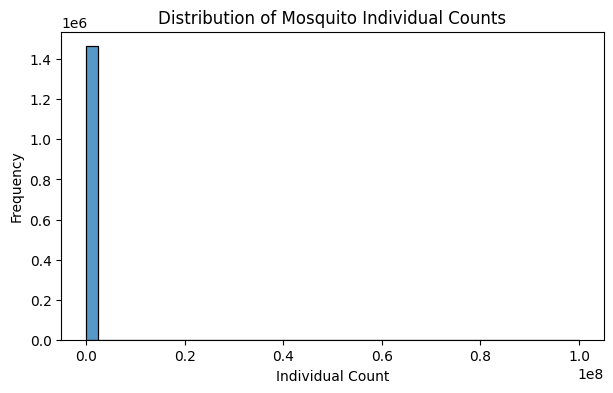

In [ ]:
plt.figure(figsize=(7,4))
sns.histplot(df_focus["individualCount"], bins=40)
plt.title("Distribution of Mosquito Individual Counts")
plt.xlabel("Individual Count")
plt.ylabel("Frequency")
plt.show()

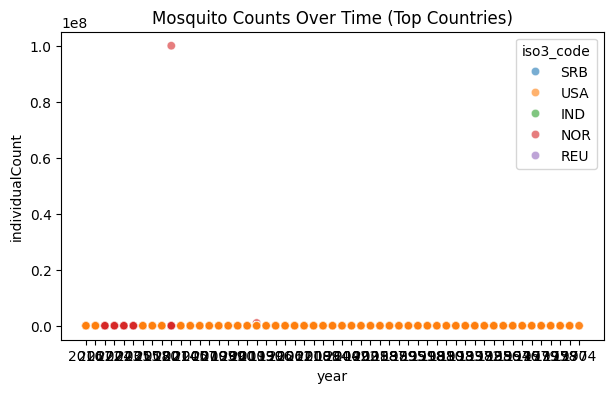

In [ ]:
plt.figure(figsize=(7,4))
sns.scatterplot(
    data=df_focus,
    x="year",
    y="individualCount",
    hue="iso3_code",
    alpha=0.6
)
plt.title("Mosquito Counts Over Time (Top Countries)")
plt.show()


# Pre-Integration Visualization

## Temperature v

In [ ]:
temperature_df.head(1)

,Country,Code,Month,Year,Temperature
0,Afghanistan,AFG,1,1950,-2.655707


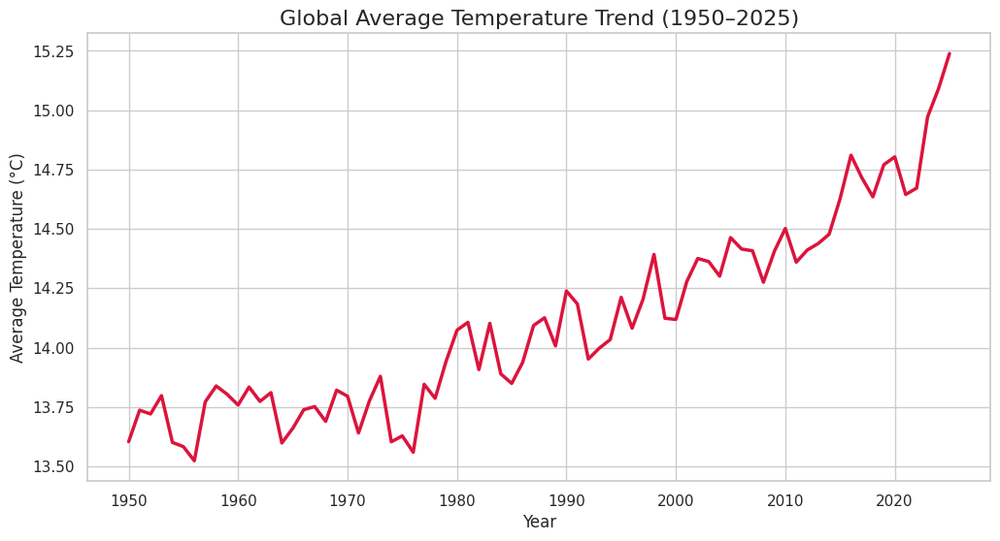

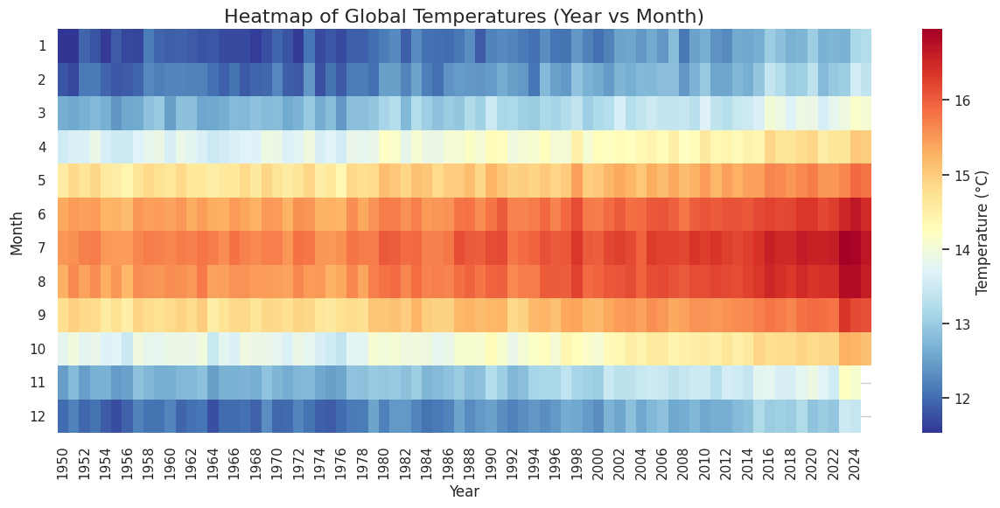

In [ ]:

import seaborn as sns
from matplotlib import pyplot as plt

sns.set_theme(style="whitegrid")

#Plot A (line plot)
#the global avg temp

#there is an entity called World which holds the world average for temperature
world_data = temperature_df[temperature_df['Country'] == 'World']
yearly_avg = world_data.groupby('Year')['Temperature'].mean().reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(data=yearly_avg, x='Year', y='Temperature', color='crimson', linewidth=2.5)
plt.title('Global Average Temperature Trend (1950–2025)', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Average Temperature (°C)', fontsize=12)
plt.show()


#Plot B(heatmap)

heatmap_data = world_data.pivot(index='Month', columns='Year', values='Temperature')

plt.figure(figsize=(15, 6))
sns.heatmap(heatmap_data, cmap='RdYlBu_r', cbar_kws={'label': 'Temperature (°C)'})
plt.title('Heatmap of Global Temperatures (Year vs Month)', fontsize=16)
plt.xlabel('Year')
plt.ylabel('Month')
plt.yticks(rotation=0)
plt.show()

In [ ]:
import plotly.express as px


min_val = temperature_df['Temperature'].min()
max_val = temperature_df['Temperature'].max()


fig = px.choropleth(
    temperature_df,
    locations="Code",
    color="Temperature",
    animation_frame="Year",
    color_continuous_scale="RdYlBu_r",
    range_color=[min_val, max_val],
    title="Global Temperature Change Over Time",
    projection="natural earth",
    hover_name="Country"
)


fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 200

fig.show()

## Incidence and Death v

Global trends

comparing incidence vs deaths over time shows both disease spread and severity together.

In [ ]:
df_incidence_deaths.columns


Index(['measure', 'country', 'disease', 'year', 'case_count', 'upper',
       'lower'],
      dtype='object')

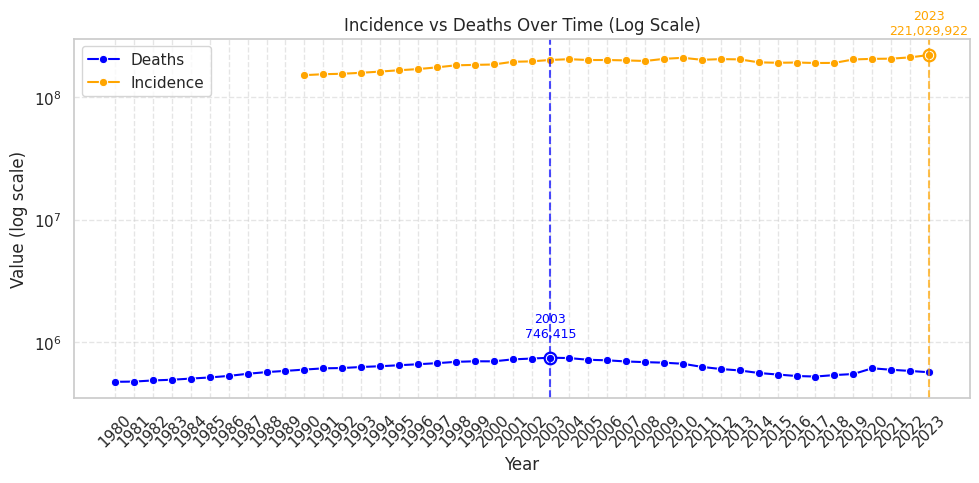

In [ ]:
#aggregate by year
df_deaths = df_incidence_deaths[df_incidence_deaths["measure"]=="Deaths"] \
    .groupby("year")["case_count"].sum().reset_index()

df_incidence = df_incidence_deaths[df_incidence_deaths["measure"]=="Incidence"] \
    .groupby("year")["case_count"].sum().reset_index()



df_deaths["measure"], df_incidence["measure"] = "Deaths", "Incidence"
df_plot = pd.concat([df_deaths, df_incidence]).sort_values("year")

#find peaks
peak_inc = df_incidence.loc[df_incidence["case_count"].idxmax()]
peak_death = df_deaths.loc[df_deaths["case_count"].idxmax()]

#plotitng
plt.figure(figsize=(10,5))
sns.lineplot(data=df_plot, x="year", y="case_count", hue="measure", marker="o",
             palette={"Incidence":"orange","Deaths":"blue"})
plt.yscale("log")

#annotate peaks
for peak, color, label in [(peak_inc,"orange","Incidence"), (peak_death,"blue","Deaths")]:
    plt.axvline(x=peak["year"], color=color, linestyle="--", alpha=0.7)
    plt.scatter(peak["year"], peak["case_count"], color=color, s=80)
    plt.text(peak["year"], peak["case_count"]*1.4, f"{int(peak['year'])}\n{int(peak['case_count']):,}",
             ha="center", va="bottom", color=color, fontsize=9)

plt.title("Incidence vs Deaths Over Time (Log Scale)")
plt.xlabel("Year"); plt.ylabel("Value (log scale)")
plt.xticks(df_plot["year"].unique(), rotation=45)
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend(); plt.tight_layout(); plt.show()

In [ ]:
unique_causes=df_incidence_deaths['disease'].unique()
unique_causes

array(['Zika virus', 'Malaria', 'Dengue', 'Yellow fever'], dtype=object)

Cause-specific trend

 This plot uses a log scale to compare incidence and deaths for the same cause.

 Deaths data starts earlier 1980 due to vital records, while incidence begins later 1990 with case reporting.

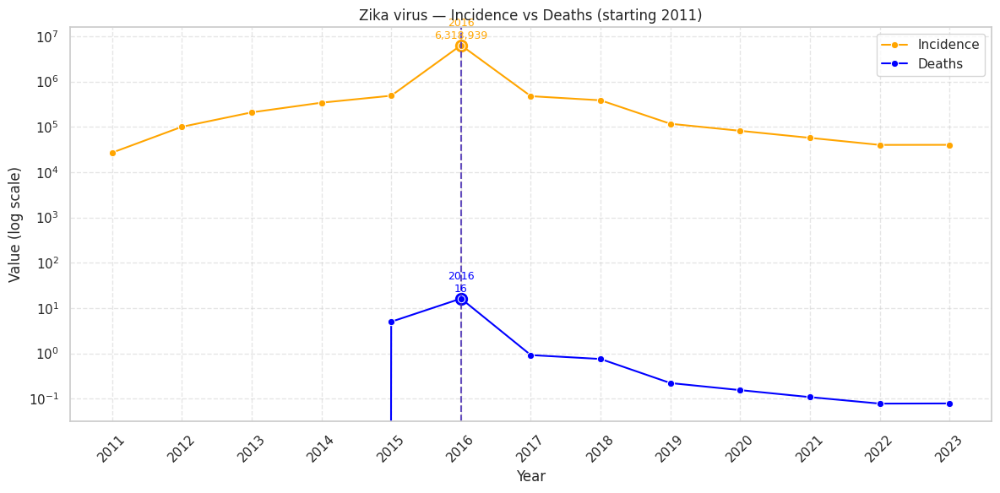

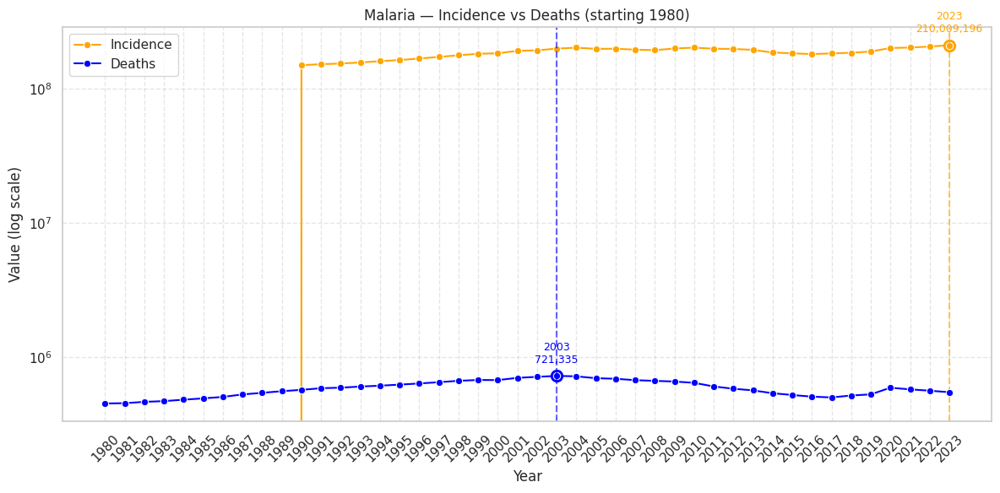

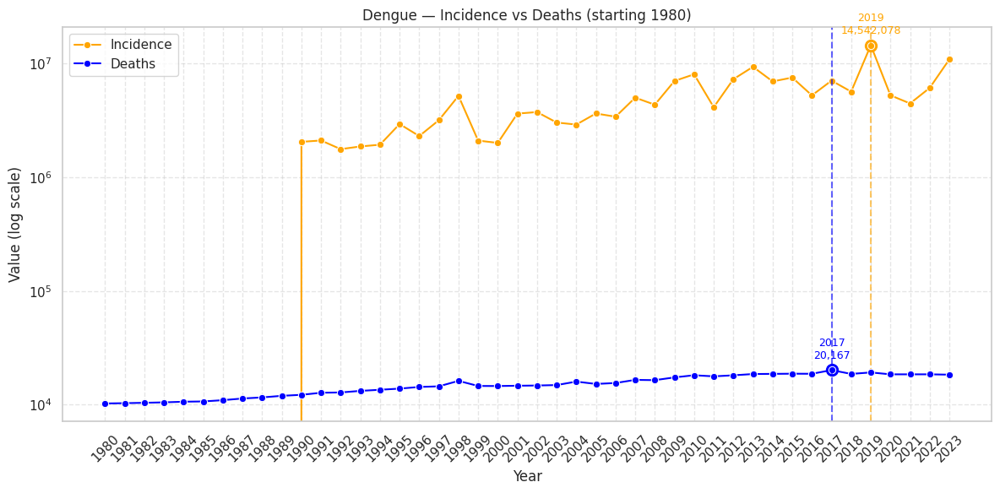

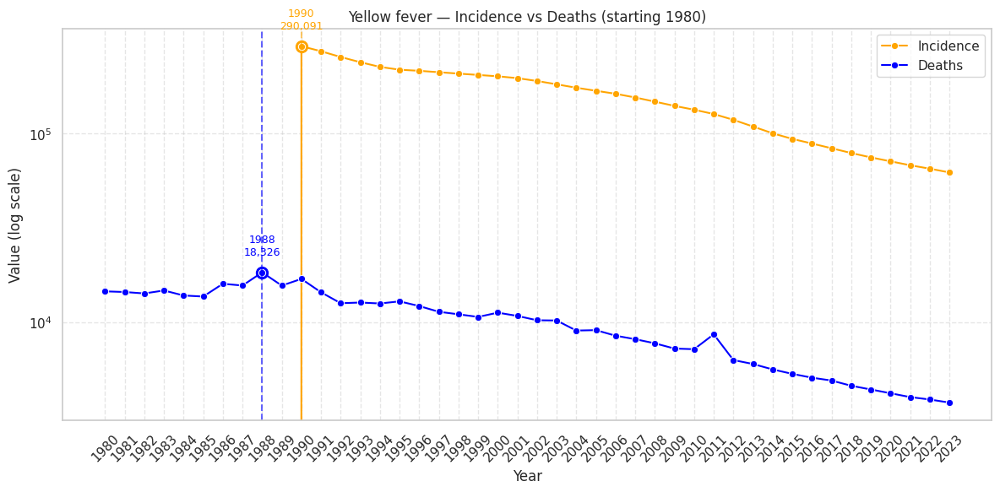

In [ ]:
for cause in unique_causes:
    # Aggregate by year and measure
    df_cause = (
        df_incidence_deaths[df_incidence_deaths["disease"] == cause]
        .groupby(["year","measure"])["case_count"]
        .sum()
        .unstack(fill_value=0)
        .reset_index()
        .sort_values("year")
    )

    # Find first year with any non-zero data (incidence OR deaths)
    has_data = (df_cause["Incidence"] > 0) | (df_cause["Deaths"] > 0)
    if not has_data.any():
        continue
    first_year = int(df_cause.loc[has_data, "year"].iloc[0])
    df_plot = df_cause[df_cause["year"] >= first_year]

    # Plot both measures
    plt.figure(figsize=(12,6))
    for measure, color in [("Incidence","orange"),("Deaths","blue")]:
        if measure in df_plot.columns and df_plot[measure].sum() > 0:
            sns.lineplot(data=df_plot, x="year", y=measure, marker="o", label=measure, color=color)
            peak = df_plot.loc[df_plot[measure].idxmax()]
            plt.axvline(x=peak["year"], color=color, linestyle="--", alpha=0.6)
            plt.scatter(peak["year"], peak[measure], color=color, s=100)
            plt.text(peak["year"], peak[measure]*1.2,
                     f"{int(peak['year'])}\n{int(peak[measure]):,}",
                     ha="center", va="bottom", color=color, fontsize=9)

    plt.yscale("log")
    plt.title(f"{cause} — Incidence vs Deaths (starting {first_year})")
    plt.xlabel("Year"); plt.ylabel("Value (log scale)")
    plt.xticks(df_plot["year"].unique(), rotation=45)
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.legend(); plt.tight_layout(); plt.show()

use the original linear scale to show raw trends more clearly.

In [ ]:
for cause in unique_causes:
    #filter data for the current cause
    df_cause = df_incidence_deaths[df_incidence_deaths['disease'] == cause]

    #group by year and measure_name to sum the values
    df_plot = df_cause.groupby(['year', 'disease'])['case_count'].sum().unstack().reset_index()

    print(f"\n--- Analysis for {cause} ---")

    sns.set_style("darkgrid")

    #plotting deaths
    if 'Deaths' in df_plot.columns:
        plt.figure(figsize=(12, 7))
        sns.lineplot(data=df_plot, x='year', y='Deaths', label='Deaths', color='red', marker='o')
        plt.title(f'{cause} - Total Deaths Over Time')
        plt.xlabel('Year')
        plt.ylabel('Number of Deaths')
        plt.xticks(df_plot['year'], rotation=45)
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

        #find and print peak year for deaths
        if not df_plot['Deaths'].empty:
            peak_deaths_year = df_plot.loc[df_plot['Deaths'].idxmax(), 'year']
            peak_deaths_val = df_plot['Deaths'].max()
            print(f"Peak Deaths for {cause}: {int(peak_deaths_val)} in year {peak_deaths_year}")

    #plotting incidence
    if 'Incidence' in df_plot.columns:
        plt.figure(figsize=(12, 7))
        sns.lineplot(data=df_plot, x='year', y='Incidence', label='Incidence', color='blue', marker='o')
        plt.title(f'{cause} - Total Incidence Over Time')
        plt.xlabel('Year')
        plt.ylabel('Number of Incidents')
        plt.xticks(df_plot['year'], rotation=45)
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

        #find and print peak year for incidence
        if not df_plot['Incidence'].empty:
            peak_incidence_year = df_plot.loc[df_plot['Incidence'].idxmax(), 'year']
            peak_incidence_val = df_plot['Incidence'].max()
            print(f"Peak Incidence for {cause}: {int(peak_incidence_val)} in year {peak_incidence_year}")
    sns.reset_orig()


--- Analysis for Zika virus ---

--- Analysis for Malaria ---

--- Analysis for Dengue ---

--- Analysis for Yellow fever ---


In [ ]:
import sys
!{sys.executable} -m pip install country_converter

#map countries to ISO3 codes and WHO regions
import country_converter as cc
df_incidence_deaths['iso3'] = cc.convert(names=df_incidence_deaths['country'], to='iso3', not_found=None)
# Get all unique ISO3 codes present in the dataset
unique_Iso3Codes = df_incidence_deaths["iso3"].dropna().unique()
print(f"\nNumber of unique ISO3 codes in dataset: {len(unique_Iso3Codes)}")
print(unique_Iso3Codes)




Number of unique ISO3 codes in dataset: 160
['TLS' 'VNM' 'MDV' 'BHS' 'YEM' 'TCD' 'CYP' 'VUT' 'PRI' 'BDI' 'CHE' 'LBR'
 'NLD' 'CIV' 'COL' 'MNG' 'KGZ' 'ARM' 'SVK' 'FJI' 'ALB' 'GBR' 'BHR' 'DNK'
 'KIR' 'CRI' 'MLI' 'BEN' 'VCT' 'BRB' 'MMR' 'KEN' 'MDG' 'EGY' 'GMB' 'SUR'
 'KHM' 'BLZ' 'HUN' 'KNA' 'FSM' 'PNG' 'MHL' 'NOR' 'COM' 'MRT' 'PHL' 'SVN'
 'ASM' 'MWI' 'QAT' 'BMU' 'BFA' 'DOM' 'SEN' 'IDN' 'LAO' 'FIN' 'PRT' 'DZA'
 'TJK' 'AZE' 'SLV' 'GTM' 'HND' 'KWT' 'UZB' 'TTO' 'NER' 'MKD' 'SMR' 'GEO'
 'HTI' 'CUB' 'LKA' 'NRU' 'AFG' 'CMR' 'VIR' 'MUS' 'FRA' 'ROU' 'IRN' 'MYS'
 'THA' 'CPV' 'DJI' 'NGA' 'NIU' 'MNP' 'DEU' 'COK' 'SAU' 'ISL' 'STP' 'GRD'
 'KAZ' 'DMA' 'MOZ' 'MEX' 'WSM' 'PLW' 'TUR' 'SLB' 'SSD' 'TKL' 'SYR' 'GUY'
 'MNE' 'SLE' 'MCO' 'TON' 'ERI' 'AND' 'LBN' 'LBY' 'TUV' 'TUN' 'JAM' 'LCA'
 'IRL' 'BIH' 'IRQ' 'GRC' 'SRB' 'NIC' 'RWA' 'GUM' 'PAN' 'ARE' 'MAR' 'AUT'
 'SOM' 'TKM' 'TGO' 'JOR' 'HRV' 'POL' 'ISR' 'VEN' 'ATG' 'SWE' 'BGR' 'PSE'
 'GIN' 'TZA' 'BEL' 'ETH' 'ITA' 'OMN' 'UGA' 'SYC' 'MLT' 'LUX' 'CZE' 'SDN'
 'ZMB'

In [ ]:
#check if any country names failed to convert
unmatched= df_incidence_deaths[df_incidence_deaths['iso3'].isnull()]['country'].unique()
if len(unmatched) > 0:
    print("unmatched location names:")
    for loc in unmatched:
        print(f"- {loc}")
else:
    print("All locations matched to ISO3 codes.")

All locations matched to ISO3 codes.


In [ ]:
#define ISO3 to WHO region
unique_iso3_codes= df_incidence_deaths['iso3'].dropna().unique()
iso3_to_who_region = {
    'AFG': 'Eastern Mediterranean',
    'ALB': 'Europe',
    'DZA': 'Africa',
    'ASM': 'Western Pacific',
    'AND': 'Europe',
    'AGO': 'Africa',
    'AIA': 'Americas',
    'ATG': 'Americas',
    'ARG': 'Americas',
    'ARM': 'Europe',
    'ABW': 'Americas',
    'AUS': 'Western Pacific',
    'AUT': 'Europe',
    'AZE': 'Europe',
    'BHS': 'Americas',
    'BHR': 'Eastern Mediterranean',
    'BGD': 'South-East Asia',
    'BRB': 'Americas',
    'BLR': 'Europe',
    'BEL': 'Europe',
    'BLZ': 'Americas',
    'BEN': 'Africa',
    'BMU': 'Americas',
    'BTN': 'South-East Asia',
    'BOL': 'Americas',
    'BIH': 'Europe',
    'BWA': 'Africa',
    'BRA': 'Americas',
    'VGB': 'Americas',
    'BRN': 'Western Pacific',
    'BGR': 'Europe',
    'BFA': 'Africa',
    'BDI': 'Africa',
    'CPV': 'Africa',
    'KHM': 'Western Pacific',
    'CMR': 'Africa',
    'CAN': 'Americas',
    'CYM': 'Americas',
    'CAF': 'Africa',
    'TCD': 'Africa',
    'CHL': 'Americas',
    'CHN': 'Western Pacific',
    'COL': 'Americas',
    'COM': 'Africa',
    'COG': 'Africa',
    'COK': 'Western Pacific',
    'CRI': 'Americas',
    'HRV': 'Europe',
    'CUB': 'Americas',
    'CYP': 'Europe',
    'CZE': 'Europe',
    'CIV': 'Africa',
    'PRK': 'South-East Asia',
    'COD': 'Africa',
    'DNK': 'Europe',
    'DJI': 'Eastern Mediterranean',
    'DMA': 'Americas',
    'DOM': 'Americas',
    'ECU': 'Americas',
    'EGY': 'Eastern Mediterranean',
    'SLV': 'Americas',
    'GNQ': 'Africa',
    'ERI': 'Africa',
    'EST': 'Europe',
    'SWZ': 'Africa',
    'ETH': 'Africa',
    'FJI': 'Western Pacific',
    'FIN': 'Europe',
    'FRA': 'Europe',
    'PYF': 'Western Pacific',
    'GAB': 'Africa',
    'GMB': 'Africa',
    'GEO': 'Europe',
    'DEU': 'Europe',
    'GHA': 'Africa',
    'GRC': 'Europe',
    'GRD': 'Americas',
    'GUM': 'Western Pacific',
    'GTM': 'Americas',
    'GIN': 'Africa',
    'GNB': 'Africa',
    'GUY': 'Americas',
    'HTI': 'Americas',
    'HND': 'Americas',
    'HKG': 'Western Pacific',
    'HUN': 'Europe',
    'ISL': 'Europe',
    'IND': 'South-East Asia',
    'IDN': 'South-East Asia',
    'IRN': 'Eastern Mediterranean',
    'IRQ': 'Eastern Mediterranean',
    'IRL': 'Europe',
    'ISR': 'Europe',
    'ITA': 'Europe',
    'JAM': 'Americas',
    'JPN': 'Western Pacific',
    'JOR': 'Eastern Mediterranean',
    'KAZ': 'Europe',
    'KEN': 'Africa',
    'KIR': 'Western Pacific',
    'KWT': 'Eastern Mediterranean',
    'KGZ': 'Europe',
    'LAO': 'Western Pacific',
    'LVA': 'Europe',
    'LBN': 'Eastern Mediterranean',
    'LSO': 'Africa',
    'LBR': 'Africa',
    'LBY': 'Eastern Mediterranean',
    'LIE': 'Europe',
    'LTU': 'Europe',
    'LUX': 'Europe',
    'MDG': 'Africa',
    'MWI': 'Africa',
    'MYS': 'Western Pacific',
    'MDV': 'South-East Asia',
    'MLI': 'Africa',
    'MLT': 'Europe',
    'MHL': 'Western Pacific',
    'MRT': 'Africa',
    'MUS': 'Africa',
    'MEX': 'Americas',
    'FSM': 'Western Pacific',
    'MDA': 'Europe',
    'MCO': 'Europe',
    'MNG': 'Western Pacific',
    'MNE': 'Europe',
    'MAR': 'Eastern Mediterranean',
    'MOZ': 'Africa',
    'MMR': 'South-East Asia',
    'NAM': 'Africa',
    'NRU': 'Western Pacific',
    'NPL': 'South-East Asia',
    'NLD': 'Europe',
    'NZL': 'Western Pacific',
    'NIC': 'Americas',
    'NER': 'Africa',
    'NGA': 'Africa',
    'NIU': 'Western Pacific',
    'MKD': 'Europe',
    'NOR': 'Europe',
    'OMN': 'Eastern Mediterranean',
    'PAK': 'Eastern Mediterranean',
    'PLW': 'Western Pacific',
    'PAN': 'Americas',
    'PNG': 'Western Pacific',
    'PRY': 'Americas',
    'PER': 'Americas',
    'PHL': 'Western Pacific',
    'POL': 'Europe',
    'PRT': 'Europe',
    'PRI': 'Americas',
    'QAT': 'Eastern Mediterranean',
    'KOR': 'Western Pacific',
    'ROU': 'Europe',
    'RUS': 'Europe',
    'RWA': 'Africa',
    'KNA': 'Americas',
    'LCA': 'Americas',
    'VCT': 'Americas',
    'WSM': 'Western Pacific',
    'SMR': 'Europe',
    'STP': 'Africa',
    'SAU': 'Eastern Mediterranean',
    'SEN': 'Africa',
    'SRB': 'Europe',
    'SYC': 'Africa',
    'SLE': 'Africa',
    'SGP': 'Western Pacific',
    'SVK': 'Europe',
    'SVN': 'Europe',
    'SLB': 'Western Pacific',
    'SOM': 'Eastern Mediterranean',
    'ZAF': 'Africa',
    'SSD': 'Africa',
    'ESP': 'Europe',
    'LKA': 'South-East Asia',
    'SDN': 'Eastern Mediterranean',
    'SUR': 'Americas',
    'SWE': 'Europe',
    'CHE': 'Europe',
    'SYR': 'Eastern Mediterranean',
    'TJK': 'Europe',
    'THA': 'South-East Asia',
    'TLS': 'South-East Asia',
    'TGO': 'Africa',
    'TON': 'Western Pacific',
    'TTO': 'Americas',
    'TUN': 'Eastern Mediterranean',
    'TUR': 'Europe',
    'TKM': 'Europe',
    'TUV': 'Western Pacific',
    'UGA': 'Africa',
    'UKR': 'Europe',
    'ARE': 'Eastern Mediterranean',
    'GBR': 'Europe',
    'TZA': 'Africa',
    'USA': 'Americas',
    'URY': 'Americas',
    'UZB': 'Europe',
    'VUT': 'Western Pacific',
    'VEN': 'Americas',
    'VNM': 'Western Pacific',
    'YEM': 'Eastern Mediterranean',
    'ZMB': 'Africa',
    'ZWE': 'Africa',
    "VIR":"Americas",
    "MNP":"Western Pacific",
    "TKL":"Western Pacific",
    "PSE":"Eastern Mediterranean",
    "ASM":"Western Pacific",
    "NIU":"Western Pacific"
}
print("ISO3 to WHO region mapping dictionary created.")

ISO3 to WHO region mapping dictionary created.


In [ ]:
# Check for duplicate keys
keys = list(iso3_to_who_region.keys())
duplicates = [k for k in set(keys) if keys.count(k)> 1]

print("Duplicate keys:", duplicates)

Duplicate keys: []


In [ ]:
df_incidence_deaths["who_region"] = df_incidence_deaths["iso3"].map(iso3_to_who_region)

In [ ]:
unmapped_regions= df_incidence_deaths[df_incidence_deaths['who_region'].isnull()]['country'].unique()
if len(unmapped_regions)> 0:
    print("unmapped locations:")
    for loc in unmapped_regions:
        print(f"- {loc}")
else:
    print("all countries mapped to WHO regions.")

all countries mapped to WHO regions.



Total deaths by WHO region calculated:
              who_region  case_count
0                 Africa  24,883,183
1               Americas     156,123
2  Eastern Mediterranean     537,335
3                 Europe      15,353
4        South-East Asia     972,507
5        Western Pacific     285,341

WHO Region with the Highest Total Deaths:
who_region       Africa
case_count   24,883,183
Name: 0, dtype: object


/tmp/ipykernel_55/3929582542.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




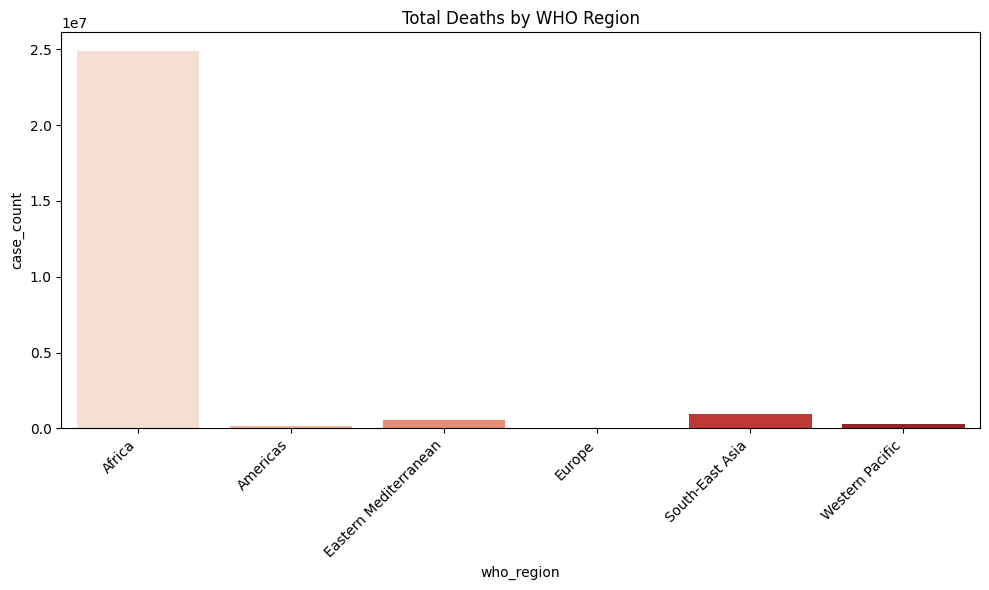


Total incidence by WHO region calculated:
              who_region    case_count
0                 Africa 5,877,457,454
1               Americas   113,947,435
2  Eastern Mediterranean   182,138,356
3                 Europe     2,043,421
4        South-East Asia   152,740,515
5        Western Pacific   139,078,827

WHO Region with the Highest Total Incidence:
who_region          Africa
case_count   5,877,457,454
Name: 0, dtype: object


/tmp/ipykernel_55/3929582542.py:35: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




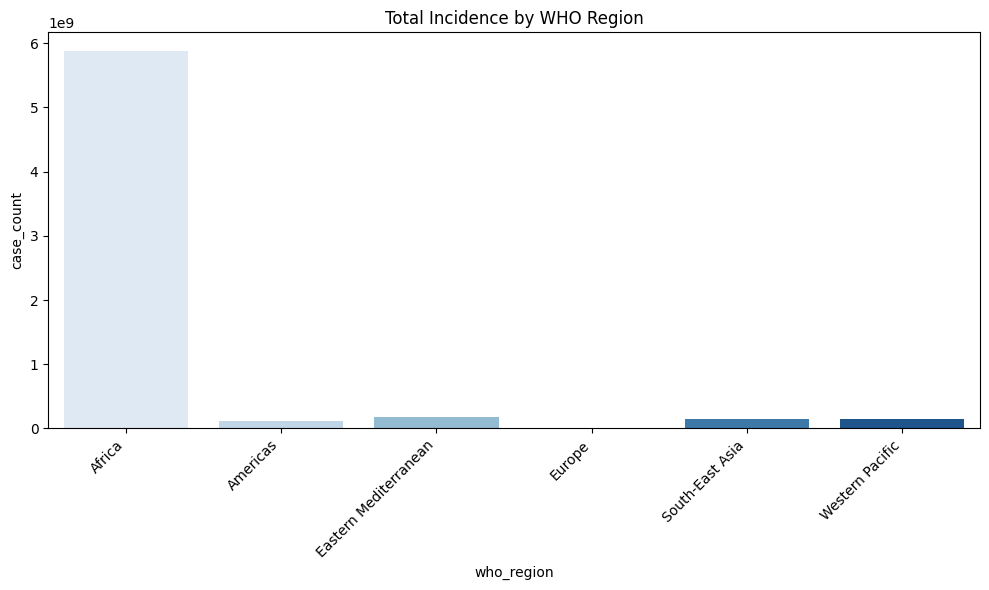

In [ ]:
#format floats to show full numbers with commas
pd.options.display.float_format = '{:,.0f}'.format

#deaths by WHO region
df_total_deaths_by_region = (
    df_incidence_deaths[df_incidence_deaths["measure"]=="Deaths"]
    .groupby("who_region")["case_count"].sum().reset_index()
)
print("\nTotal deaths by WHO region calculated:")
print(df_total_deaths_by_region)

highest_deaths_region = df_total_deaths_by_region.loc[df_total_deaths_by_region["case_count"].idxmax()]
print("\nWHO Region with the Highest Total Deaths:")
print(highest_deaths_region)

plt.figure(figsize=(10,6))
sns.barplot(data=df_total_deaths_by_region, x="who_region", y="case_count", palette="Reds")
plt.title("Total Deaths by WHO Region")
plt.xticks(rotation=45, ha="right")
plt.tight_layout(); plt.show()

#incidence by WHO region
df_total_incidence_by_region = (
    df_incidence_deaths[df_incidence_deaths["measure"]=="Incidence"]
    .groupby("who_region")["case_count"].sum().reset_index()
)
print("\nTotal incidence by WHO region calculated:")
print(df_total_incidence_by_region)

highest_incidence_region = df_total_incidence_by_region.loc[df_total_incidence_by_region["case_count"].idxmax()]
print("\nWHO Region with the Highest Total Incidence:")
print(highest_incidence_region)

plt.figure(figsize=(10,6))
sns.barplot(data=df_total_incidence_by_region, x="who_region", y="case_count", palette="Blues")
plt.title("Total Incidence by WHO Region")
plt.xticks(rotation=45, ha="right")
plt.tight_layout(); plt.show()

/tmp/ipykernel_55/3904203300.py:12: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




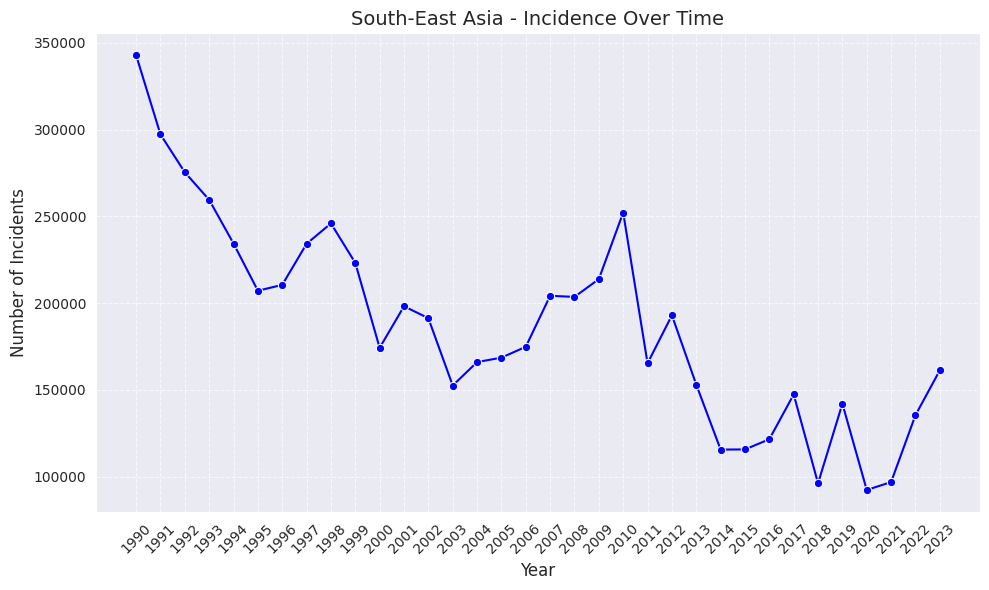

/tmp/ipykernel_55/3904203300.py:25: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




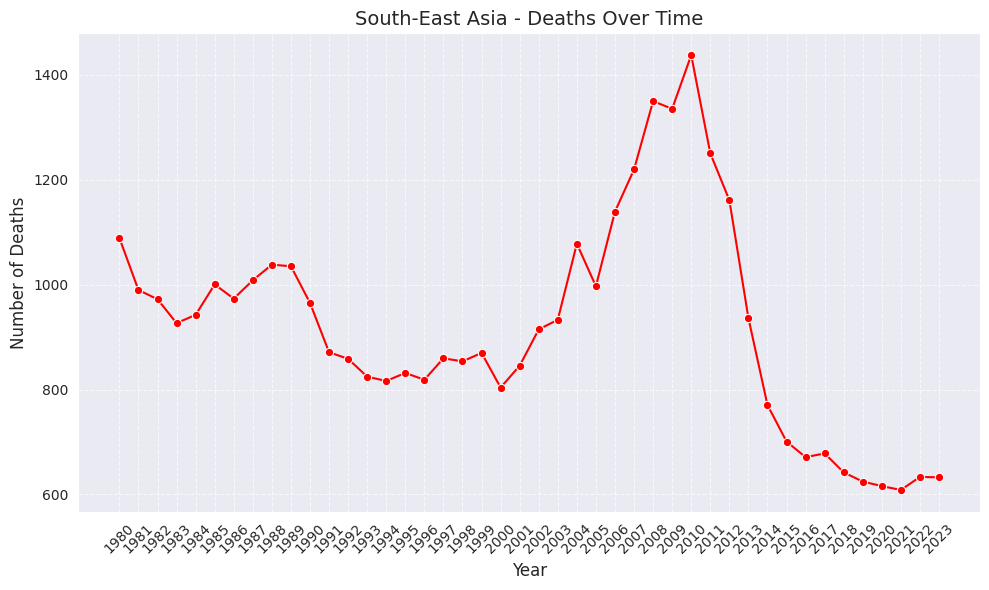

/tmp/ipykernel_55/3904203300.py:12: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




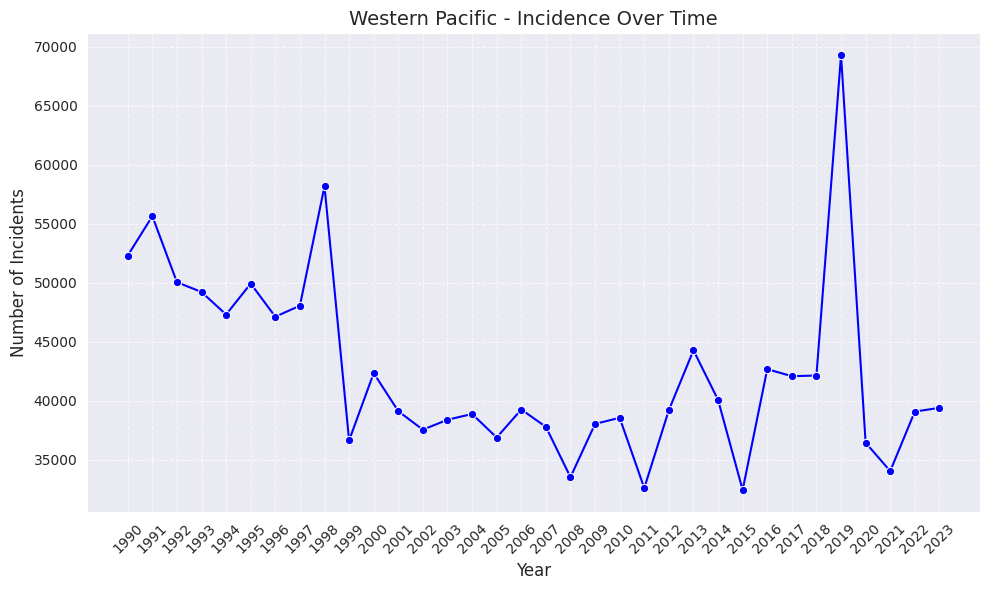

/tmp/ipykernel_55/3904203300.py:25: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




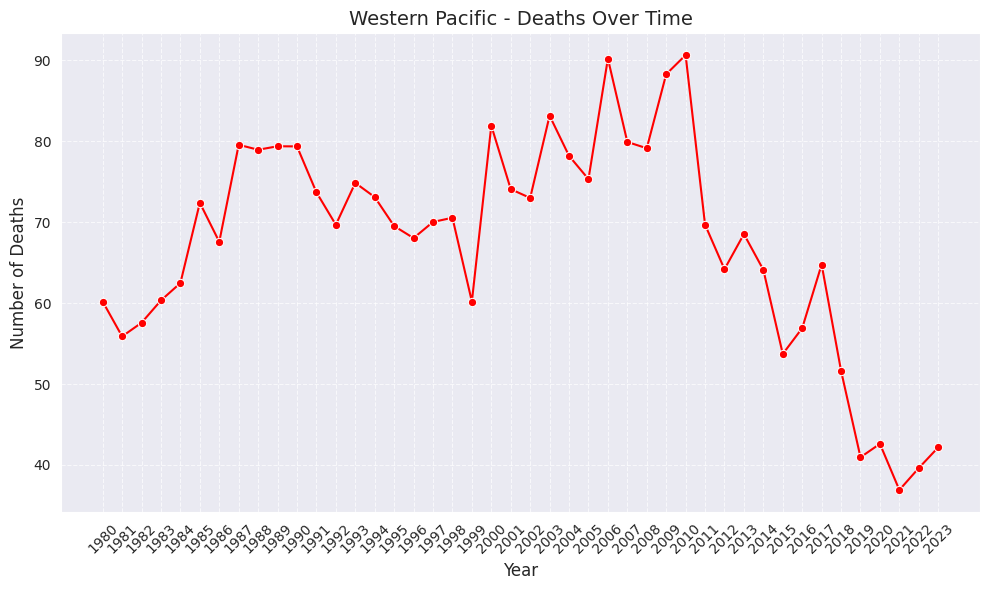

/tmp/ipykernel_55/3904203300.py:12: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




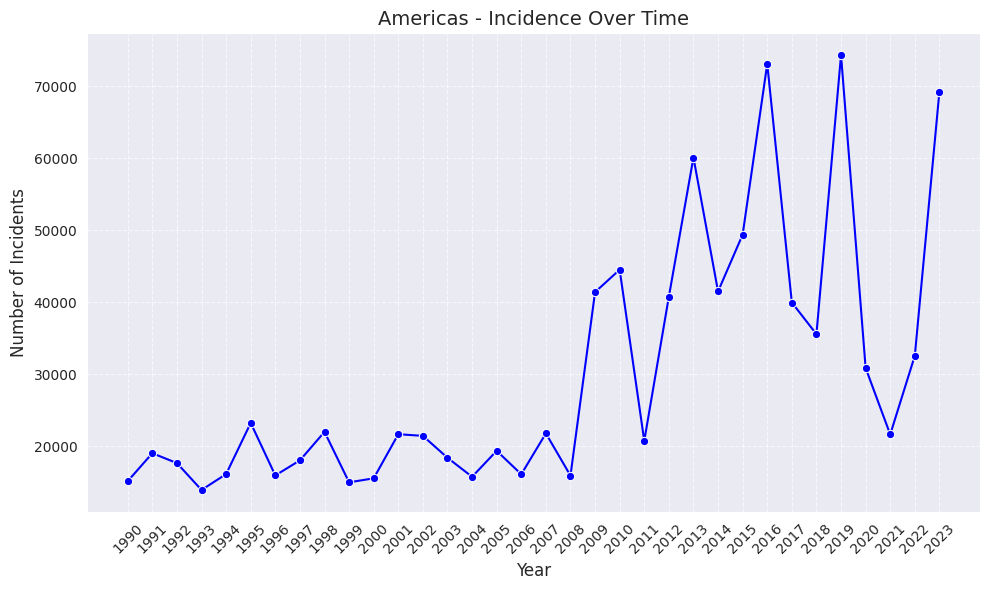

/tmp/ipykernel_55/3904203300.py:25: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




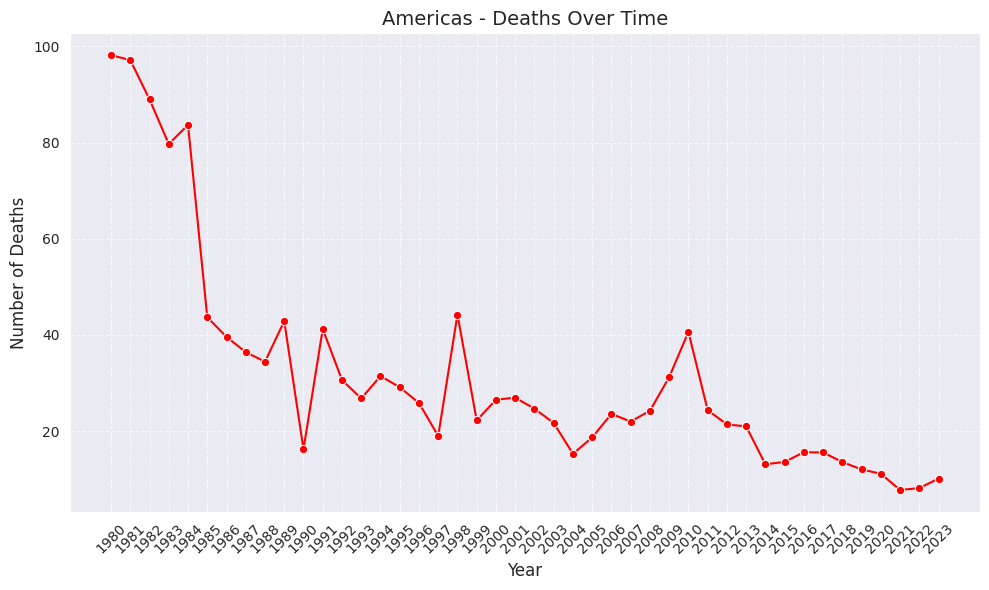

/tmp/ipykernel_55/3904203300.py:12: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




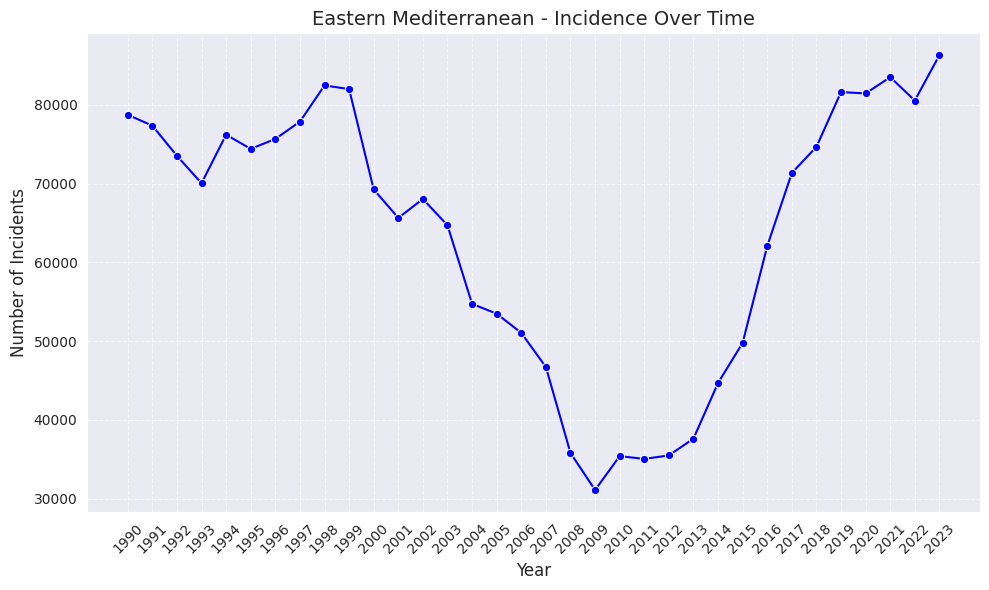

/tmp/ipykernel_55/3904203300.py:25: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




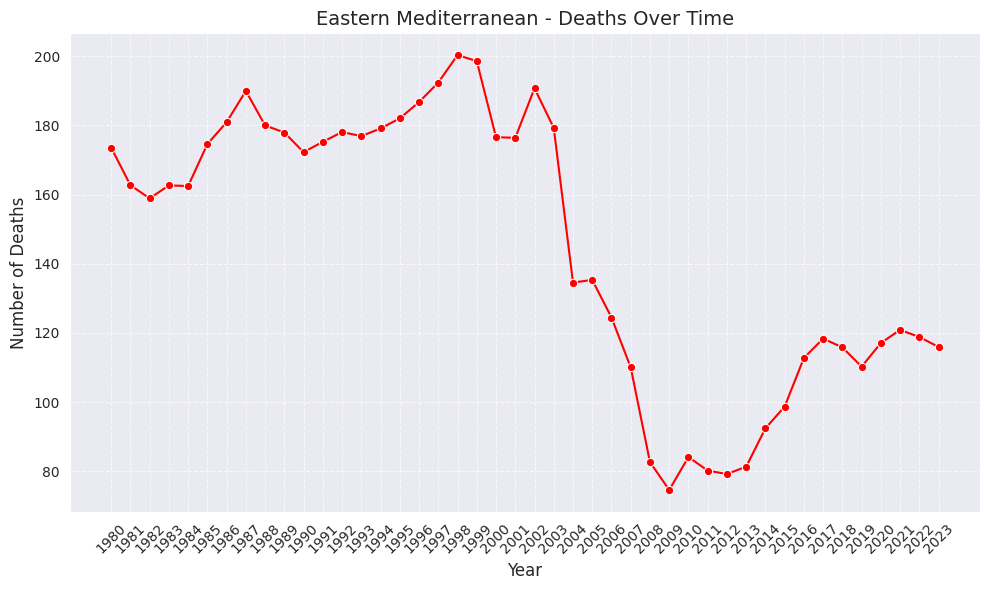

/tmp/ipykernel_55/3904203300.py:12: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




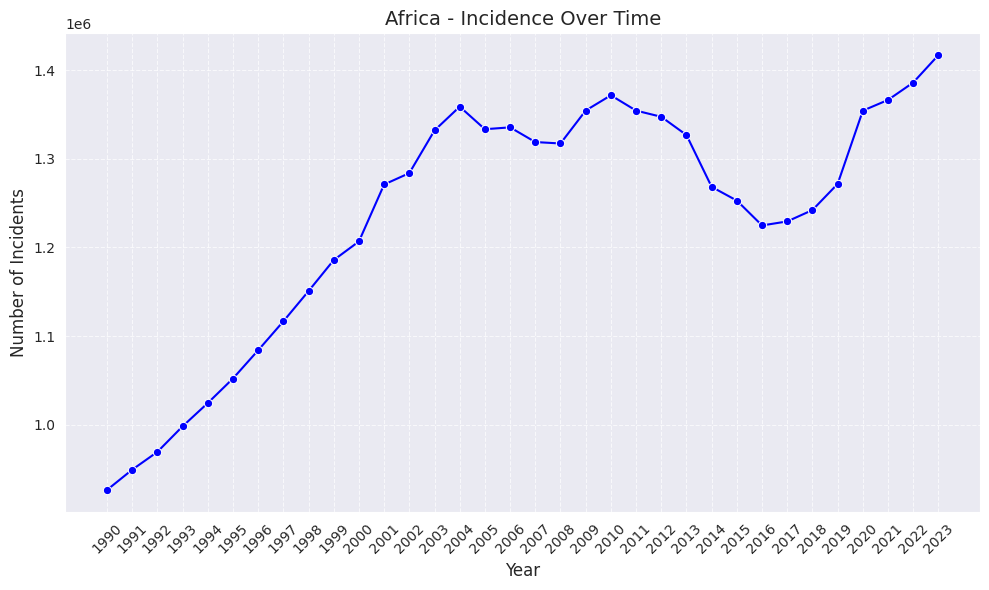

/tmp/ipykernel_55/3904203300.py:25: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




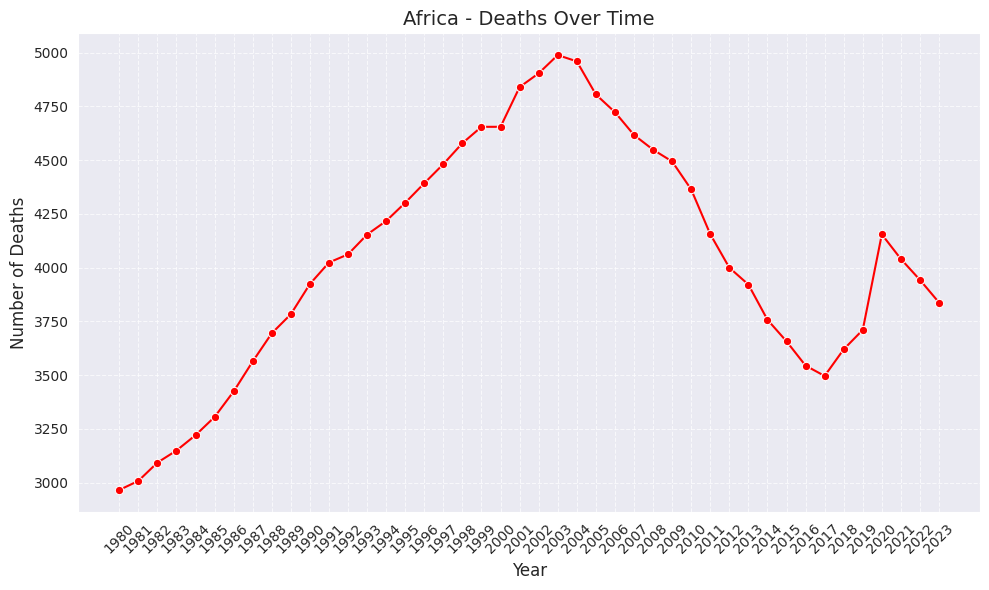

/tmp/ipykernel_55/3904203300.py:12: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




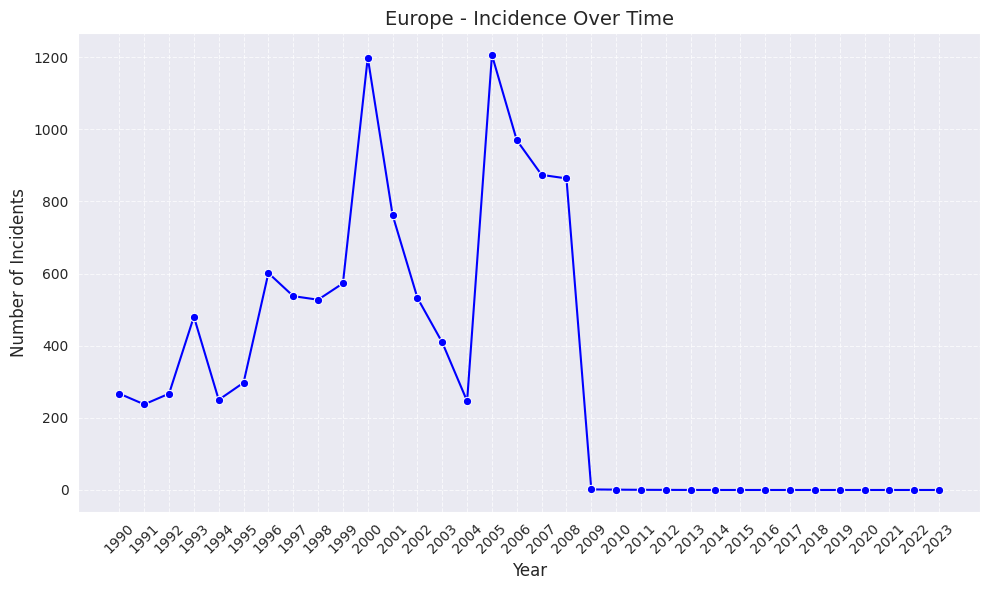

/tmp/ipykernel_55/3904203300.py:25: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




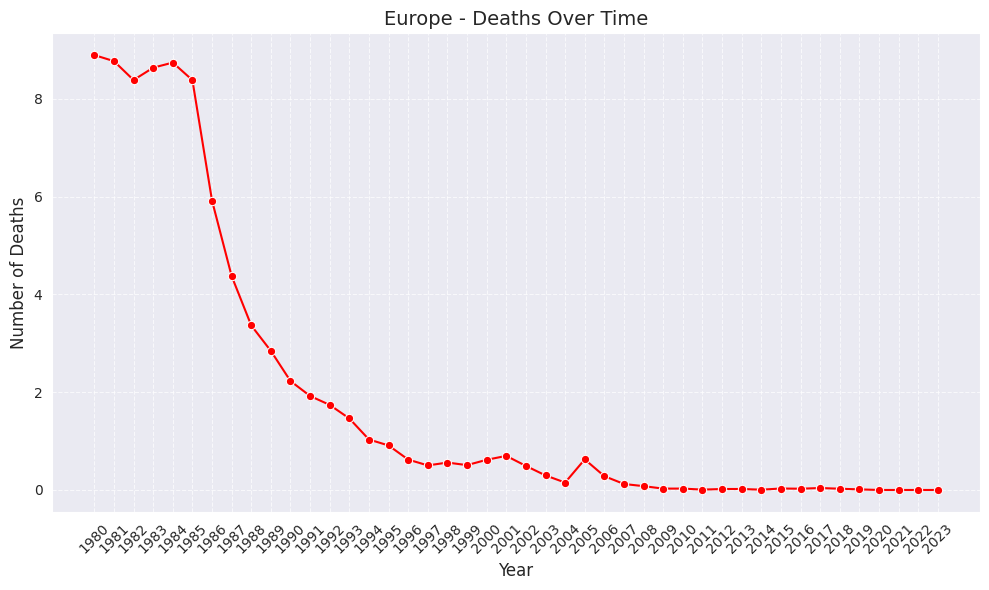

In [ ]:
regions = df_incidence_deaths["who_region"].unique()

for region in regions:
    df_region = df_incidence_deaths[df_incidence_deaths["who_region"] == region]

    sns.set_style("darkgrid")

    #plot incidence
    df_inc = df_region[df_region["measure"]=="Incidence"]
    if not df_inc.empty:
        plt.figure(figsize=(10,6))
        sns.lineplot(data=df_inc, x="year", y="case_count", color="blue", marker="o", ci=None)
        plt.xticks(sorted(df_inc["year"].unique()), rotation=45)   # show every year
        plt.title(f"{region} - Incidence Over Time", fontsize=14)
        plt.xlabel("Year", fontsize=12)
        plt.ylabel("Number of Incidents", fontsize=12)
        plt.grid(True, linestyle="--", alpha=0.7)
        plt.tight_layout()
        plt.show()

    #plot death
    df_deaths = df_region[df_region["measure"]=="Deaths"]
    if not df_deaths.empty:
        plt.figure(figsize=(10,6))
        sns.lineplot(data=df_deaths, x="year", y="case_count", color="red", marker="o", ci=None)
        plt.xticks(sorted(df_deaths["year"].unique()), rotation=45)   # show every year
        plt.title(f"{region} - Deaths Over Time", fontsize=14)
        plt.xlabel("Year", fontsize=12)
        plt.ylabel("Number of Deaths", fontsize=12)
        plt.grid(True, linestyle="--", alpha=0.7)
        plt.tight_layout()
        plt.show()

    sns.reset_orig()

country level comparisons by cause

In [ ]:
#summarize deaths by WHO region and country
df_region_country = (
    df_incidence_deaths[df_incidence_deaths["measure"]=="Deaths"]
    .groupby(["who_region","country"])["case_count"].sum().reset_index()
)

#drop countries with zero deaths
df_region_country = df_region_country[df_region_country["case_count"] > 0]

#convert values to integers
df_region_country["case_count"] = df_region_country["case_count"].astype(int)

#get list of WHO regions
regions = df_region_country["who_region"].unique()

#loop through regions and plot treemap
for region in regions:
    #filter region and drop any zero values again
    df_sub = df_region_country[df_region_country["who_region"] == region]
    df_sub = df_sub[df_sub["case_count"] > 0]

    #skip if region has no valid countries
    if df_sub.empty:
        print(f"Skipping {region} (no valid data)")
        continue

    fig = px.treemap(
        df_sub,
        path=["country"],#only countries inside this region
        values="case_count",
        color="case_count",
        color_continuous_scale="Reds",
        title=f"Treemap of Deaths by Country in {region}"
    )

    fig.update_layout(margin=dict(t=50, l=25, r=25, b=25))
    fig.show()

In [ ]:
#summarize incidence by WHO region and country
df_region_country_inc = (
    df_incidence_deaths[df_incidence_deaths["measure"]=="Incidence"]
    .groupby(["who_region","country"])["case_count"].sum().reset_index()
)

#drop countries with zero incidence
df_region_country_inc = df_region_country_inc[df_region_country_inc["case_count"] > 0]

#convert values to integers
df_region_country_inc["case_count"] = df_region_country_inc["case_count"].astype(int)

#Get list of WHO regions
regions = df_region_country_inc["who_region"].unique()

#loop through regions and plot treemap
for region in regions:
    #filter region and drop any zero values again
    df_sub = df_region_country_inc[df_region_country_inc["who_region"] == region]
    df_sub = df_sub[df_sub["case_count"] > 0]

    #skip if region has no valid countries
    if df_sub.empty:
        print(f"Skipping {region} (no valid incidence data)")
        continue

    fig = px.treemap(
        df_sub,
        path=["country"],   # only countries inside this region
        values="case_count",
        color="case_count",
        color_continuous_scale="Blues",
        title=f"Treemap of Incidence by Country in {region}"
    )

    fig.update_layout(margin=dict(t=50, l=25, r=25, b=25))
    fig.show()

In [ ]:
'''
print("\n--- Analysis of Countries with Peak Deaths and Incidence ---")

for cause, df_plot in cause_data_for_plotting.items():
    print(f"\nCause: {cause}")

    # --- Identify country column dynamically ---
    country_col = None
    for col in df_plot.columns:
        if "location" in col.lower() or "country" in col.lower():
            country_col = col
            break

    if country_col is None:
        print("  ⚠ No country column found in this dataframe!")
        continue

    # --- Deaths ---
    if "Deaths" in df_plot.columns and not df_plot["Deaths"].empty:
        peak_deaths_row = df_plot.loc[df_plot["Deaths"].idxmax()]
        print(f"  Country with Peak Deaths: {peak_deaths_row[country_col]} ({int(peak_deaths_row['Deaths'])} deaths)")
    else:
        print("  No recorded deaths for this cause in any country.")

    # --- Incidence ---
    if "Incidence" in df_plot.columns and not df_plot["Incidence"].empty:
        peak_incidence_row = df_plot.loc[df_plot["Incidence"].idxmax()]
        print(f"  Country with Peak Incidence: {peak_incidence_row[country_col]} ({int(peak_incidence_row['Incidence'])} incidents)")
    else:
        print("  No recorded incidence for this cause in any country.")

'''

'\nprint("\n--- Analysis of Countries with Peak Deaths and Incidence ---")\n\nfor cause, df_plot in cause_data_for_plotting.items():\n    print(f"\nCause: {cause}")\n\n    # --- Identify country column dynamically ---\n    country_col = None\n    for col in df_plot.columns:\n        if "location" in col.lower() or "country" in col.lower():\n            country_col = col\n            break\n\n    if country_col is None:\n        print("  ⚠ No country column found in this dataframe!")\n        continue\n\n    # --- Deaths ---\n    if "Deaths" in df_plot.columns and not df_plot["Deaths"].empty:\n        peak_deaths_row = df_plot.loc[df_plot["Deaths"].idxmax()]\n        print(f"  Country with Peak Deaths: {peak_deaths_row[country_col]} ({int(peak_deaths_row[\'Deaths\'])} deaths)")\n    else:\n        print("  No recorded deaths for this cause in any country.")\n\n    # --- Incidence ---\n    if "Incidence" in df_plot.columns and not df_plot["Incidence"].empty:\n        peak_incidence_row =

In [ ]:
df_deaths = (df_incidence_deaths[df_incidence_deaths["measure"]=="Deaths"].groupby("disease")["case_count"].sum().reset_index().rename(columns={"case_count":"deaths"}))

#total incidence per cause
df_incidence = (
    df_incidence_deaths[df_incidence_deaths["measure"]=="Incidence"]
    .groupby("disease")["case_count"].sum()
    .reset_index()
    .rename(columns={"case_count":"incidence"})
)

#merging
df_cfr = pd.merge(df_deaths, df_incidence, on="disease", how="outer").fillna(0)

#compute CFR
df_cfr["CFR"] = (df_cfr["deaths"] / df_cfr["incidence"]) * 100

#sort
df_cfr_sorted = df_cfr.sort_values("CFR", ascending=False)
pd.options.display.float_format = '{:,.2f}'.format
print(df_cfr_sorted[["disease","deaths","incidence","CFR"]].head(20))

        disease        deaths        incidence  CFR
2  Yellow fever    443,377.39     5,323,921.94 8.33
1       Malaria 25,742,569.88 6,286,263,344.37 0.41
0        Dengue    663,870.65   167,145,860.59 0.40
3    Zika virus         23.45     8,672,881.18 0.00


- Yellow fever shows CFR ≈ 8%: relatively high fatality compared to other mosquito-borne diseases.
- Malaria CFR ≈ 0.41% : millions of deaths, but billions of cases dilute the fatality percentage.
- Dengue CFR ≈ 0.40% :similar to malaria: large case numbers make CFR look small.
- Zika virus CFR ≈ 0.00% : very few deaths compared to millions of cases, so CFR is negligible.


CFR highlights proportional risk, not just raw deaths. Diseases with huge incidence (Malaria, Dengue)
show small CFRs even with large death counts, while Yellow fever stands out as most dangerous in this dataset.



## Percipitation v

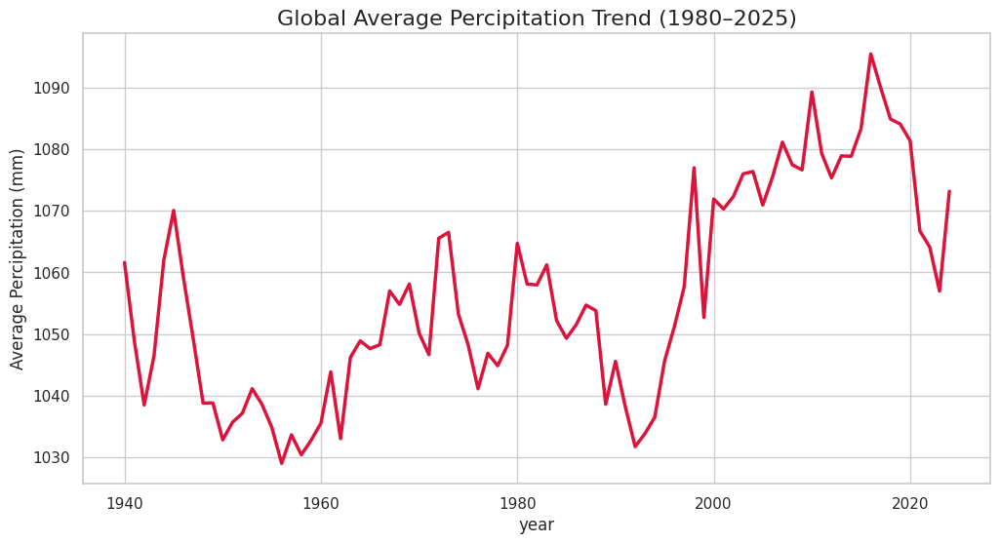

In [ ]:
import seaborn as sns
from matplotlib import pyplot as plt

sns.set_theme(style="whitegrid")

world_data = percipitation_df[percipitation_df['Country'] == 'World']
yearly_avg = world_data.groupby('Year')['Annual precipitation'].mean().reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(data=yearly_avg, x='Year', y='Annual precipitation', color='crimson', linewidth=2.5)
plt.title('Global Average Percipitation Trend (1980–2025)', fontsize=16)
plt.xlabel('year', fontsize=12)
plt.ylabel('Average Percipitation (mm)', fontsize=12)
plt.show()

/tmp/ipykernel_55/3422475964.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



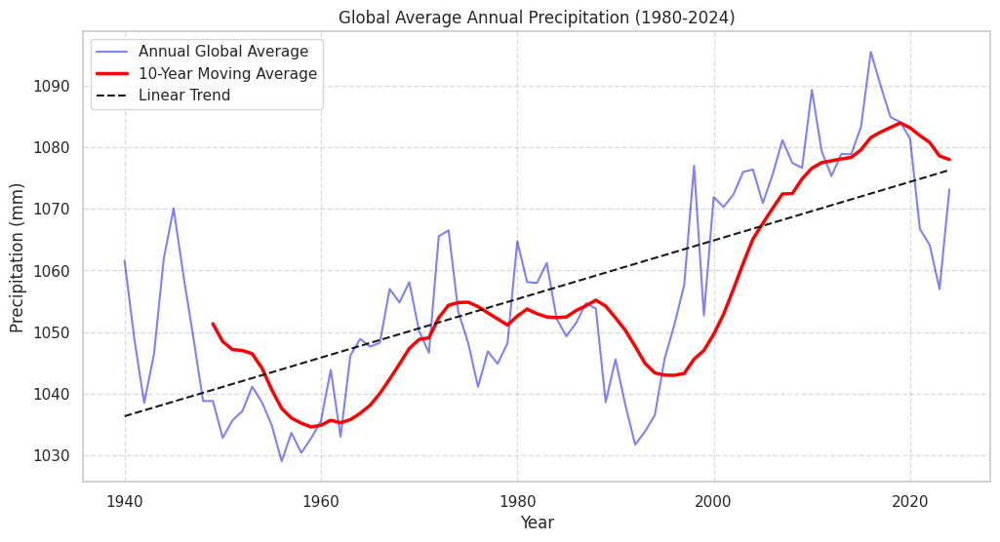

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

world_df = percipitation_df[percipitation_df['Country'] == 'World']


world_df['10-year MA'] = world_df['Annual precipitation'].rolling(window=10).mean()

plt.figure(figsize=(12, 6))

sns.lineplot(data=world_df, x='Year', y='Annual precipitation',
             label='Annual Global Average', alpha=0.5, color='blue')

sns.lineplot(data=world_df, x='Year', y='10-year MA',
             label='10-Year Moving Average', color='red', linewidth=2.5)

z = np.polyfit(world_df['Year'], world_df['Annual precipitation'], 1)
p = np.poly1d(z)
plt.plot(world_df['Year'], p(world_df['Year']), "k--", label='Linear Trend')


plt.title('Global Average Annual Precipitation (1980-2024)')
plt.ylabel('Precipitation (mm)')
plt.xlabel('Year')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

plt.show()

## Mosquito v

filtering to use only the species we are interested in, which are the disease carriers

In [ ]:
df_mosquitos["scientificName"].unique()

array(['Culex pipiens Linnaeus, 1758',
       'Aedes geniculatus (Olivier, 1791)',
       'Culiseta annulata (Schrank, 1776)', 'Culex Linnaeus, 1758',
       'Aedes rusticus (Rossi, 1790)',
       'Anopheles maculipennis Meigen, 1818',
       'Aedes dorsalis (Meigen, 1830)', 'Aedes albopictus (Skuse, 1894)',
       'Anopheles Meigen, 1818', 'Ochlerotatus caspius (Pallas, 1771)',
       'Anopheles claviger (Meigen, 1804)',
       'Anopheles algeriensis Theobald, 1903',
       'Coquillettidia richiardii (Ficalbi, 1889)',
       'Ochlerotatus cantans (Meigen, 1818)',
       'Aedes cinereus Meigen, 1818', 'Anopheles plumbeus Stephens, 1828',
       'Anopheles messeae Falleroni, 1926', 'Aedes vexans (Meigen, 1830)',
       'Culiseta morsitans (Theobald, 1901)',
       'Dahliana geniculata (Olivier, 1791)',
       'Ochlerotatus annulipes (Meigen, 1830)',
       'Ochlerotatus detritus (Haliday, 1833)',
       'Ochlerotatus rusticus (Rossi, 1790)',
       'Ochlerotatus punctor (Kirby, 1837)',


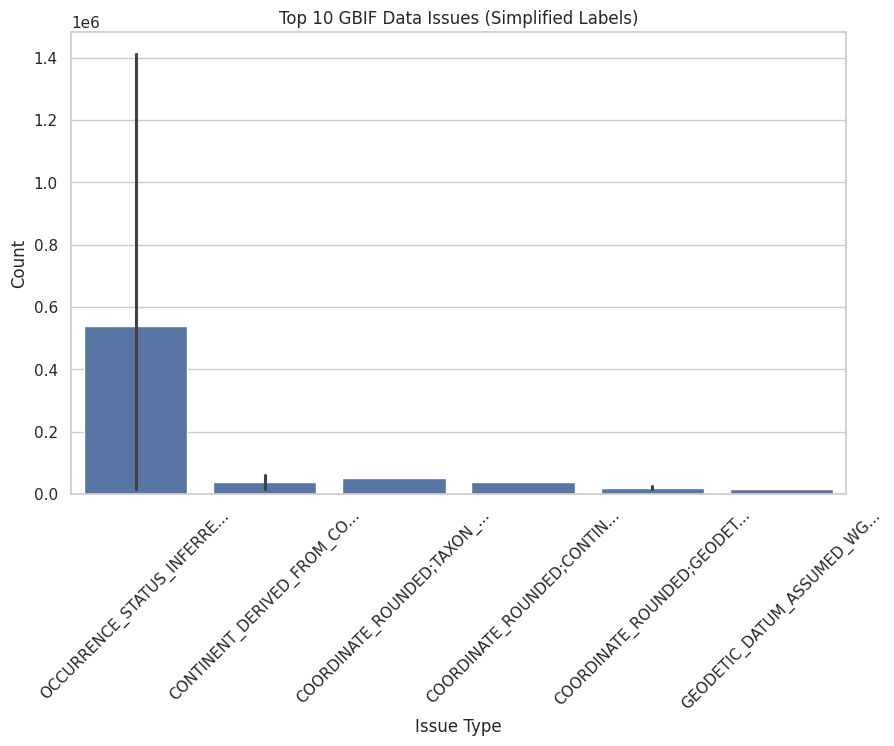

In [ ]:
# Create short labels for long issue names
df_issues = df_mosquitos['issue'].value_counts().head(10).reset_index()
df_issues.columns = ['issue_type', 'count']

# Shorten the labels manually or automatically
df_issues['short_label'] = df_issues['issue_type'].apply(lambda x: x[:25] + "..." if len(x) > 25 else x)

plt.figure(figsize=(10,6))
sns.barplot(data=df_issues, x='short_label', y='count')
plt.xticks(rotation=45)
plt.title("Top 10 GBIF Data Issues (Simplified Labels)")
plt.xlabel("Issue Type")
plt.ylabel("Count")
plt.show()

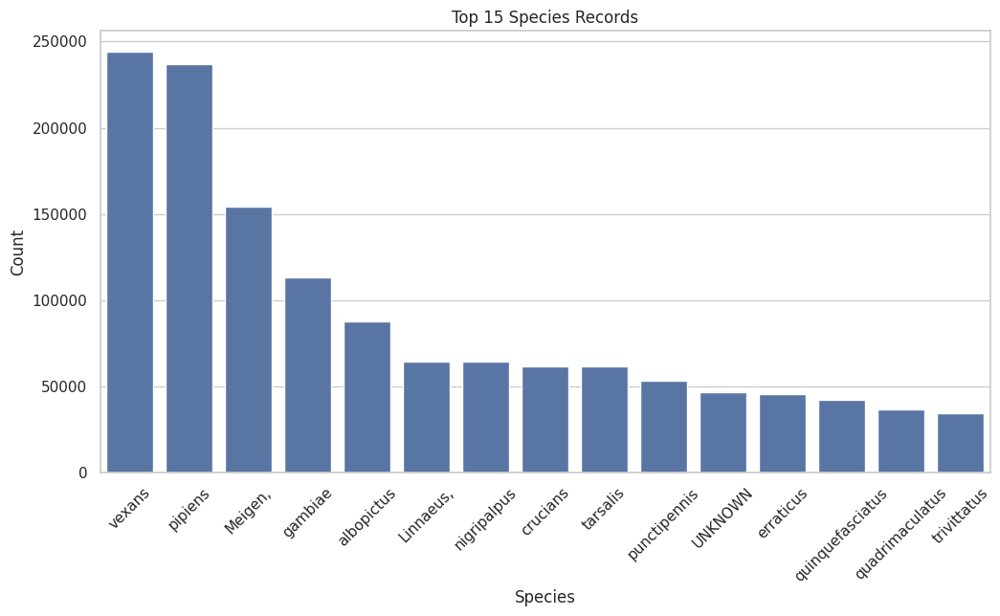

In [ ]:
top_species = df_mosquitos['specificEpithet'].value_counts().head(15).reset_index()
top_species.columns = ['species', 'count']

plt.figure(figsize=(12,6))
sns.barplot(data=top_species, x='species', y='count')
plt.xticks(rotation=45)
plt.title("Top 15 Species Records")
plt.xlabel("Species")
plt.ylabel("Count")
plt.show()

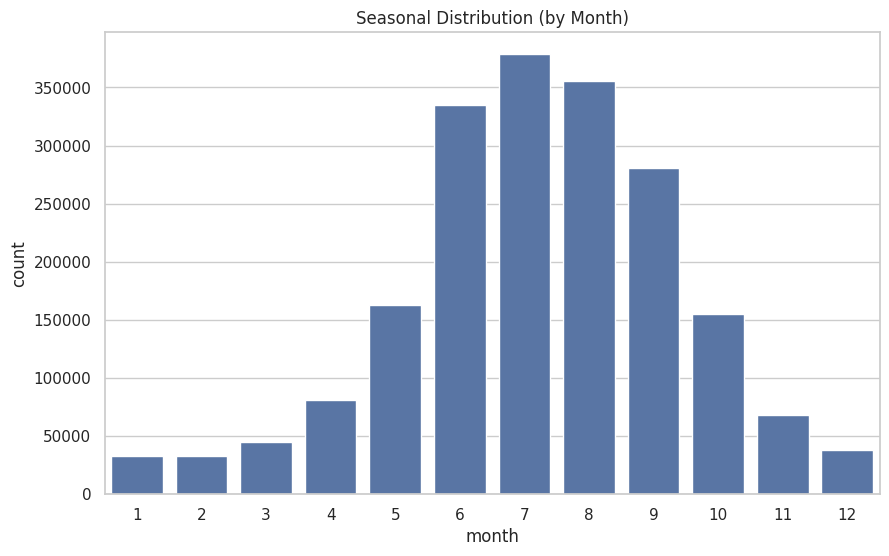

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(data=df_mosquitos, x='month')
plt.title("Seasonal Distribution (by Month)")
plt.show()

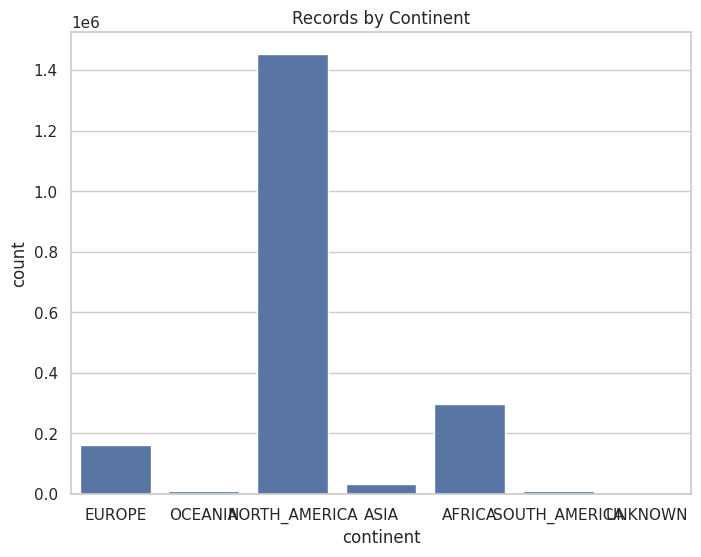

In [ ]:
plt.figure(figsize=(8,6))
sns.countplot(data=df_mosquitos, x='continent')
plt.title("Records by Continent")
plt.show()

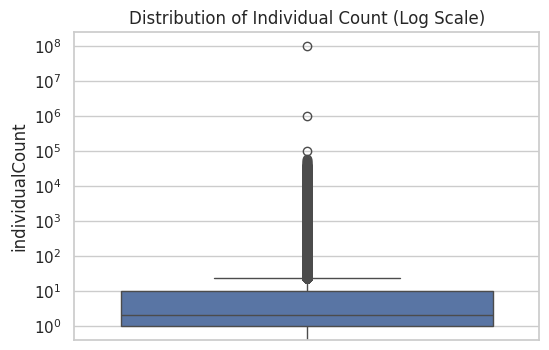

In [ ]:
plt.figure(figsize=(6,4))
sns.boxplot(data=df_mosquitos, y='individualCount')
plt.yscale('log')
plt.title("Distribution of Individual Count (Log Scale)")
plt.show()

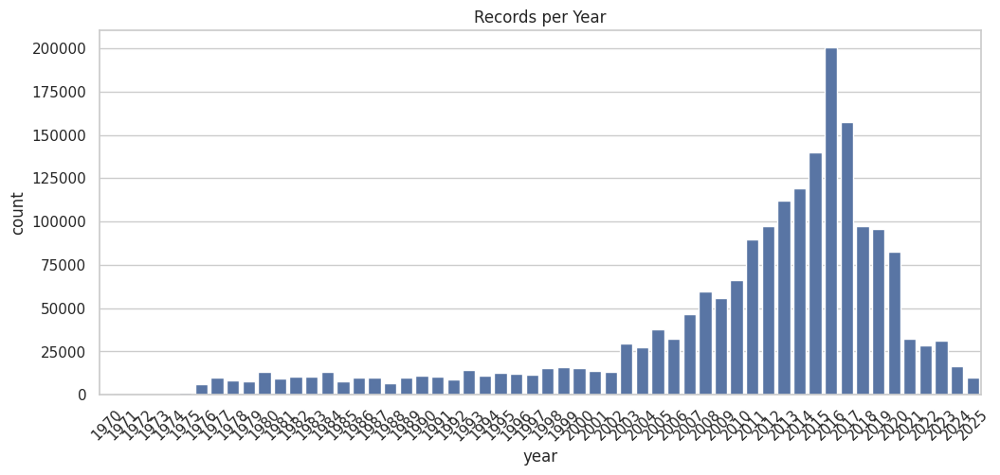

In [ ]:
plt.figure(figsize=(12,5))
sns.countplot(data=df_mosquitos, x='year', order=sorted(df_mosquitos['year'].unique()))
plt.xticks(rotation=45)
plt.title("Records per Year")
plt.show()

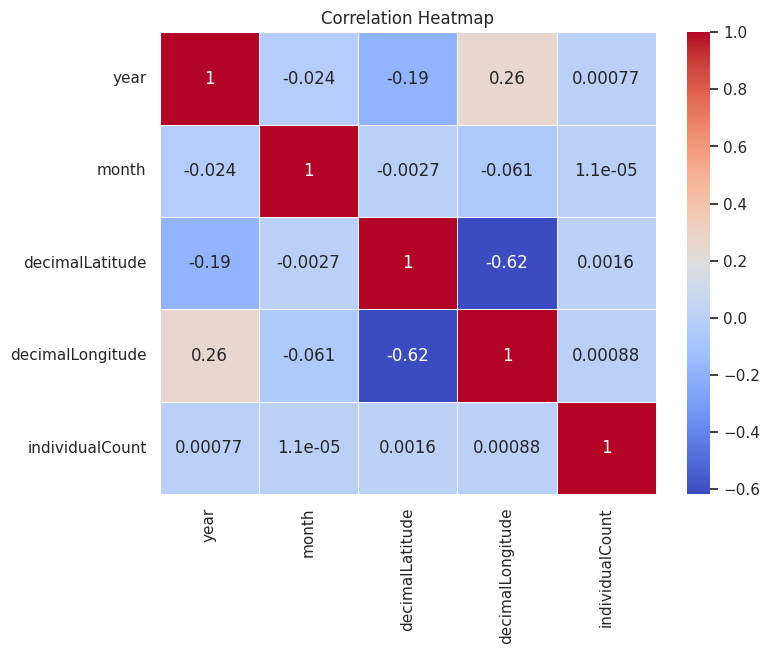

In [ ]:
# Select numeric columns only
numeric_cols = ['year', 'month', 'decimalLatitude', 'decimalLongitude', 'individualCount']

corr = df_mosquitos[numeric_cols].corr()

plt.figure(figsize=(8,6))
sns.heatmap(corr, annot=True, cmap="coolwarm", linewidths=.5)
plt.title("Correlation Heatmap")
plt.show()

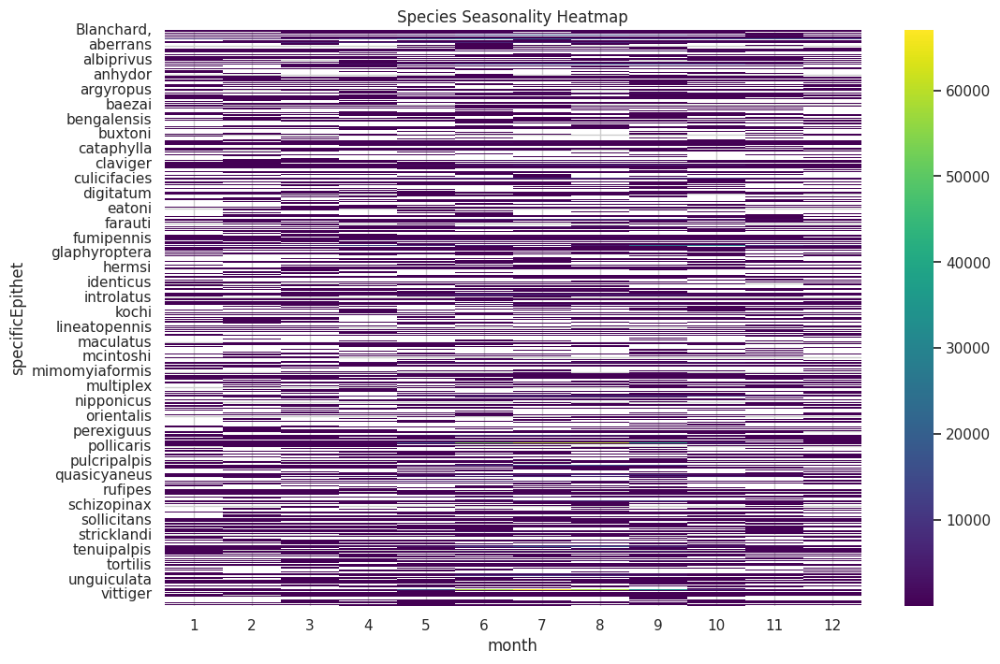

In [ ]:
species_month = df_mosquitos.groupby(['specificEpithet','month']).size().reset_index(name='count')
species_month_pivot = species_month.pivot(index='specificEpithet', columns='month', values='count')

plt.figure(figsize=(12,8))
sns.heatmap(species_month_pivot, cmap="viridis")
plt.title("Species Seasonality Heatmap")
plt.show()

# Integration code

In [ ]:
df_mosquitos.head(1)

,gbifID,individualCount,sex,year,month,continent,countryCode,decimalLatitude,decimalLongitude,scientificName,specificEpithet,issue,country,iso3_code,country_name
0,3479152715,1.00,UNKNOWN,2017,10,EUROPE,FR,50.28176,1.72171,"Culex pipiens Linnaeus, 1758",pipiens,CONTINENT_DERIVED_FROM_COORDINATES;TAXON_ID_NO...,France,FRA,France


In [ ]:
percipitation_df.head(1)

,Country,Code,Year,Annual precipitation
0,Afghanistan,AFG,1940,217.68


In [ ]:
temperature_df.head(1)

,Country,Code,Month,Year,Temperature
0,Afghanistan,AFG,1,1950,-2.66


In [ ]:
df_incidence_deaths.head(1)

,measure,country,disease,year,case_count,upper,lower,iso3,who_region
0,Deaths,Timor-Leste,Zika virus,1980,0.00,0.00,0.00,TLS,South-East Asia


In [ ]:
df_mosquitos.columns = df_mosquitos.columns.str.lower()
df_incidence_deaths.columns = df_incidence_deaths.columns.str.lower()
temperature_df.columns = temperature_df.columns.str.lower()
percipitation_df.columns = percipitation_df.columns.str.lower()

In [ ]:

percipitation_df['year'] = percipitation_df['year'].apply(pd.to_numeric)
df_mosquitos[['year','month']] = df_mosquitos[['year','month']].apply(pd.to_numeric)
temperature_df[['year','month']] = temperature_df[['year','month']].apply(pd.to_numeric)
df_incidence_deaths['year']= df_incidence_deaths['year'].apply(pd.to_numeric)


In [ ]:
def check_year():
    all_dfs = {
        "Mosquito Data": df_mosquitos,
        "Temperature Data": temperature_df,
        "Precipitation Data": percipitation_df,
        "Disease Data": df_incidence_deaths
    }

    print(f"{'DataFrame Name':<20} | {'Year Range':<12} | {'Month Range':<12}")
    print("-" * 55)


    for name, df in all_dfs.items():

        y_min = int(df['year'].min())
        y_max = int(df['year'].max())

        if 'month' in df.columns:
            m_min = int(df['month'].min())
            m_max = int(df['month'].max())
        else:
            m_min, m_max = "-", "-"

        print(f"{name:<20} | {str(y_min):<8} | {str(y_max):<8} | {str(m_min):<9} | {str(m_max):<9}")
check_year()

DataFrame Name       | Year Range   | Month Range 
-------------------------------------------------------
Mosquito Data        | 1970     | 2025     | 1         | 12       
Temperature Data     | 1950     | 2025     | 1         | 12       
Precipitation Data   | 1940     | 2024     | -         | -        
Disease Data         | 1980     | 2023     | -         | -        


In [ ]:
df_mosquitos = df_mosquitos[df_mosquitos['year'].between(1980, 2023)]
df_incidence_deaths = df_incidence_deaths[df_incidence_deaths['year'].between(1980, 2023)]
percipitation_df = percipitation_df[percipitation_df['year'].between(1980, 2023)]
temperature_df = temperature_df[temperature_df['year'].between(1980, 2023)]


In [ ]:
check_year()


DataFrame Name       | Year Range   | Month Range 
-------------------------------------------------------
Mosquito Data        | 1980     | 2023     | 1         | 12       
Temperature Data     | 1980     | 2023     | 1         | 12       
Precipitation Data   | 1980     | 2023     | -         | -        
Disease Data         | 1980     | 2023     | -         | -        


In [ ]:

month_counts = df_mosquitos.groupby('year')['month'].nunique()

incomplete_years = month_counts[month_counts < 12]

if len(incomplete_years) > 0:
    print("The years missing data:")
    print(incomplete_years)
else:
    print("All years have 12 months")

All years have 12 months


In [ ]:
!pip install pycountry

In [ ]:
import pandas as pd
import pycountry

unique_codes = df_mosquitos['countrycode'].unique()


code_map = {}

print(f"Mapping {len(unique_codes)} unique countries...")

for code in unique_codes:
    try:
        if len(str(code)) == 3:
            code_map[code] = str(code).upper()
        else:
            result = pycountry.countries.search_fuzzy(str(code))[0]
            code_map[code] = result.alpha_3
    except:
        code_map[code] = None


df_mosquitos['iso_code'] = df_mosquitos['countrycode'].map(code_map)

print("Done! Check the first few rows:")
print(df_mosquitos[['countrycode', 'iso_code']].head())

Mapping 193 unique countries...
Done! Check the first few rows:
  countrycode iso_code
0          FR      FRA
1          FR      FRA
2          FR      FRA
3          FR      FRA
4          FR      FRA


In [ ]:
import pandas as pd
import pycountry

unique_codes = df_mosquitos['countrycode'].unique()
code_map = {}
for code in unique_codes:
    try:
        if len(str(code)) == 3: code_map[code] = str(code).upper()
        else: code_map[code] = pycountry.countries.search_fuzzy(str(code))[0].alpha_3
    except: code_map[code] = None
df_mosquitos['iso_code'] = df_mosquitos['countrycode'].map(code_map)

temperature_df['iso_code'] = temperature_df['code'].copy()
percipitation_df['iso_code'] = percipitation_df['code'].copy()

unique_names = df_incidence_deaths['country'].unique()
name_map = {}

print(f"Mapping {len(unique_names)} incidence countries...")

for name in unique_names:
    try:

        name_map[name] = pycountry.countries.search_fuzzy(str(name))[0].alpha_3
    except:
        name_map[name] = None

df_incidence_deaths['iso_code'] = df_incidence_deaths['country'].map(name_map)


print(f"Mosquito: 'iso_code' in columns? {'iso_code' in df_mosquitos.columns}")
print(f"Temperature:     'iso_code' in columns? {'iso_code' in temperature_df.columns}")
print(f"Precipitation:   'iso_code' in columns? {'iso_code' in percipitation_df.columns}")
print(f"Incident and death:    'iso_code' in columns? {'iso_code' in df_incidence_deaths.columns}")

Mapping 160 incidence countries...
Mosquito: 'iso_code' in columns? True
Temperature:     'iso_code' in columns? True
Precipitation:   'iso_code' in columns? True
Incident and death:    'iso_code' in columns? True


In [ ]:
disease_wide = df_incidence_deaths.pivot_table(
    index=['iso_code', 'year'],
    columns='disease',
    values='case_count',
    aggfunc='sum'
)

disease_wide = disease_wide.reset_index()
disease_wide.columns.name = None

for col in disease_wide.columns:
    if col not in ['iso_code', 'year']:
        disease_wide.rename(columns={col: f'cases_{col}'}, inplace=True)


disease_wide = disease_wide.fillna(0)

print(disease_wide.head())

  iso_code  year  cases_Dengue  cases_Malaria  cases_Yellow fever  \
0      AFG  1980          0.04         251.66                0.00   
1      AFG  1981          0.04         241.78                0.00   
2      AFG  1982          0.03         221.63                0.00   
3      AFG  1983          0.03         250.01                0.00   
4      AFG  1984          0.03         296.47                0.00   

   cases_Zika virus  
0              0.00  
1              0.00  
2              0.00  
3              0.00  
4              0.00  


In [ ]:
df_mosquitos.columns

Index(['gbifid', 'individualcount', 'sex', 'year', 'month', 'continent',
       'countrycode', 'decimallatitude', 'decimallongitude', 'scientificname',
       'specificepithet', 'issue', 'country', 'iso3_code', 'country_name',
       'iso_code'],
      dtype='object')

In [ ]:
cols_mosquito = [
    'gbifID', 'individualCount', 'sex', 'scientificName',
    'decimalLatitude', 'decimalLongitude',
    'iso3_code', 'country', 'continent',
    'year', 'month'
]

lowercased_cols = [col.lower() for col in cols_mosquito]

df_main = df_mosquitos[lowercased_cols].copy()

df_main = df_main.rename(columns={'iso3_code': 'iso_code'})

In [ ]:
import pandas as pd


cols_mosquito = [
    'gbifid', 'individualcount', 'sex', 'scientificname',
    'decimallatitude', 'decimallongitude',
    'iso_code', 'country', 'continent',
    'year', 'month'
]

cols_mosquito = [x.lower() for x in cols_mosquito]


existing_cols = [c for c in cols_mosquito if c in df_mosquitos.columns]
df_main = df_mosquitos[existing_cols].copy()


df_temp_clean = temperature_df[['iso_code', 'year', 'month', 'temperature']].copy()
df_temp_clean = df_temp_clean.rename(columns={'temperature': 'monthly_temp'})

df_precip_clean = percipitation_df[['iso_code', 'year', 'annual precipitation']].copy()
df_precip_clean = df_precip_clean.rename(columns={'annual precipitation': 'annual_precip'})


disease_subset = df_incidence_deaths[['iso_code', 'year', 'disease', 'case_count']].copy()


df_disease_wide = disease_subset.pivot_table(
    index=['iso_code', 'year'],
    columns='disease',
    values='case_count',
    aggfunc='sum'
).reset_index()


df_disease_wide.columns.name = None
df_disease_wide = df_disease_wide.add_prefix('cases_')

df_disease_wide = df_disease_wide.rename(columns={
    'cases_iso_code': 'iso_code',
    'cases_year': 'year'
})



print("Merging Temperature...")
master_df = pd.merge(
    df_main,
    df_temp_clean,
    on=['iso_code', 'year', 'month'],
    how='left'
)

print("Merging Precipitation...")
master_df = pd.merge(
    master_df,
    df_precip_clean,
    on=['iso_code', 'year'],
    how='left'
)

print("Merging Disease...")
master_df = pd.merge(
    master_df,
    df_disease_wide,
    on=['iso_code', 'year'],
    how='left'
)

print("-" * 30)
print(f"Final Shape: {master_df.shape}")
print(f"Final Columns: {master_df.columns.tolist()}")
print("-" * 30)
print(master_df.head())

Merging Temperature...
Merging Precipitation...
Merging Disease...
------------------------------
Final Shape: (1906571, 17)
Final Columns: ['gbifid', 'individualcount', 'sex', 'scientificname', 'decimallatitude', 'decimallongitude', 'iso_code', 'country', 'continent', 'year', 'month', 'monthly_temp', 'annual_precip', 'cases_Dengue', 'cases_Malaria', 'cases_Yellow fever', 'cases_Zika virus']
------------------------------
       gbifid  individualcount      sex                     scientificname  \
0  3479152715             1.00  UNKNOWN       Culex pipiens Linnaeus, 1758   
1  4540923954             1.00  UNKNOWN       Culex pipiens Linnaeus, 1758   
2  3479116102             1.00  UNKNOWN  Aedes geniculatus (Olivier, 1791)   
3  4541016155             1.00  UNKNOWN  Culiseta annulata (Schrank, 1776)   
4  4541153293             1.00  UNKNOWN       Culex pipiens Linnaeus, 1758   

  decimallatitude decimallongitude iso_code country continent  year  month  \
0        50.28176          

In [ ]:
master_df.head(1)

,gbifid,individualcount,sex,scientificname,decimallatitude,decimallongitude,iso_code,country,continent,year,month,monthly_temp,annual_precip,cases_Dengue,cases_Malaria,cases_Yellow fever,cases_Zika virus
0,3479152715,1.00,UNKNOWN,"Culex pipiens Linnaeus, 1758",50.28176,1.72171,FRA,France,EUROPE,2017,10,15.19,"1,052.87",0.07,7.33,0.00,0.00


In [ ]:
master_df.shape

(1906571, 17)

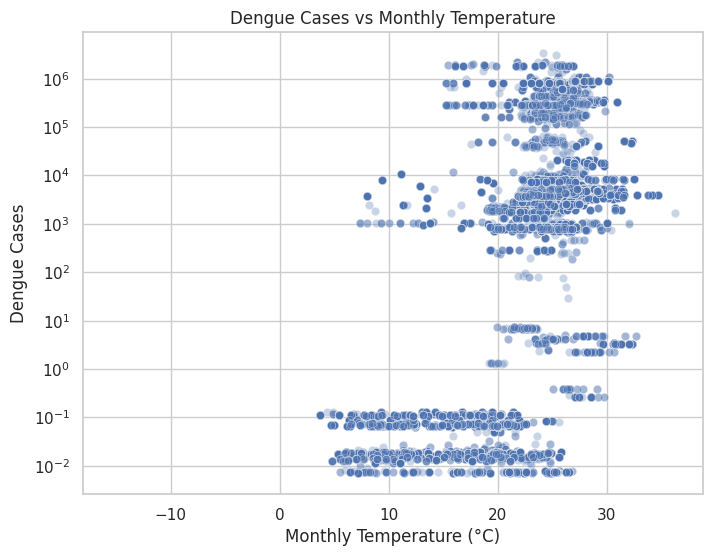

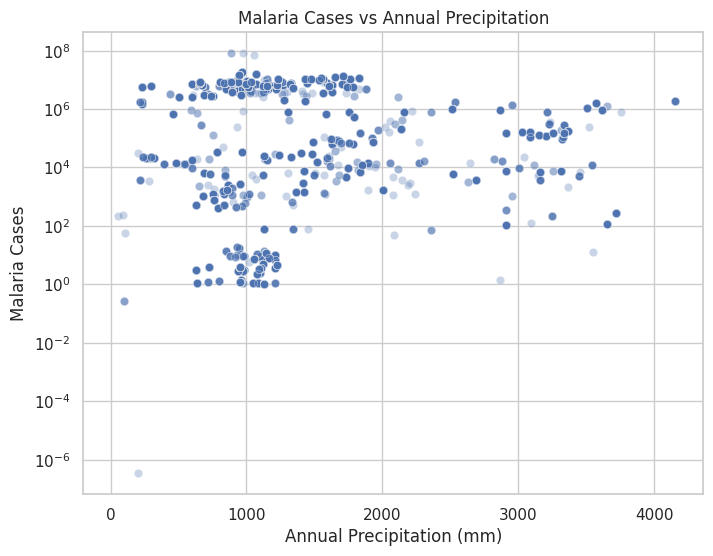

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))
sns.scatterplot(x="monthly_temp", y="cases_Dengue", data=master_df, alpha=0.3)
plt.title("Dengue Cases vs Monthly Temperature")
plt.xlabel("Monthly Temperature (°C)")
plt.ylabel("Dengue Cases")
plt.yscale("log")  # optional, if skewed
plt.show()

plt.figure(figsize=(8,6))
sns.scatterplot(x="annual_precip", y="cases_Malaria", data=master_df, alpha=0.3)
plt.title("Malaria Cases vs Annual Precipitation")
plt.xlabel("Annual Precipitation (mm)")
plt.ylabel("Malaria Cases")
plt.yscale("log")
plt.show()

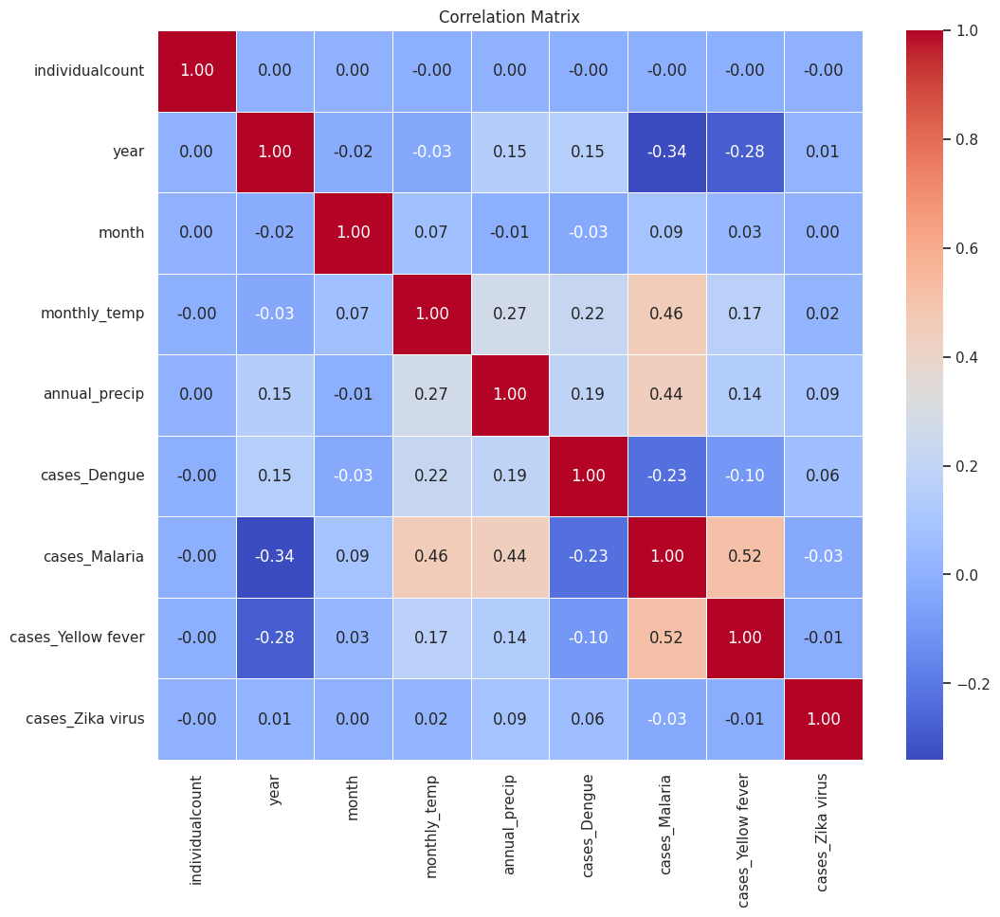

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Select only numbers
# (Pandas cannot calculate correlation on text columns like 'Country')
numeric_df = master_df.select_dtypes(include=['float64', 'int64'])

# 2. CRITICAL STEP: Squash the 370k rows into a small summary matrix
correlation_matrix = numeric_df.corr()

# 3. Plot the small matrix (Size will be roughly 10x10, not 374500x300)
plt.figure(figsize=(12, 10))
sns.heatmap(
    correlation_matrix,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    linewidths=0.5
)
plt.title("Correlation Matrix")
plt.show()

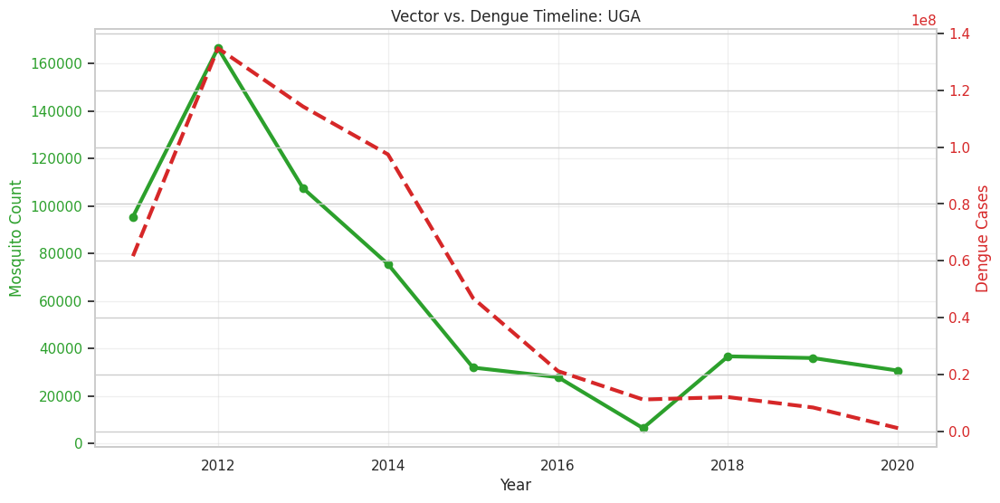

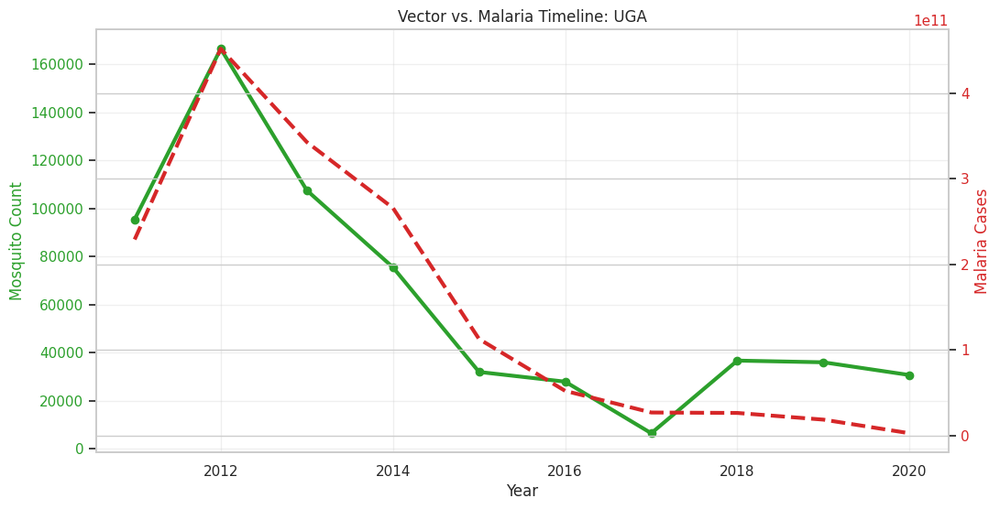

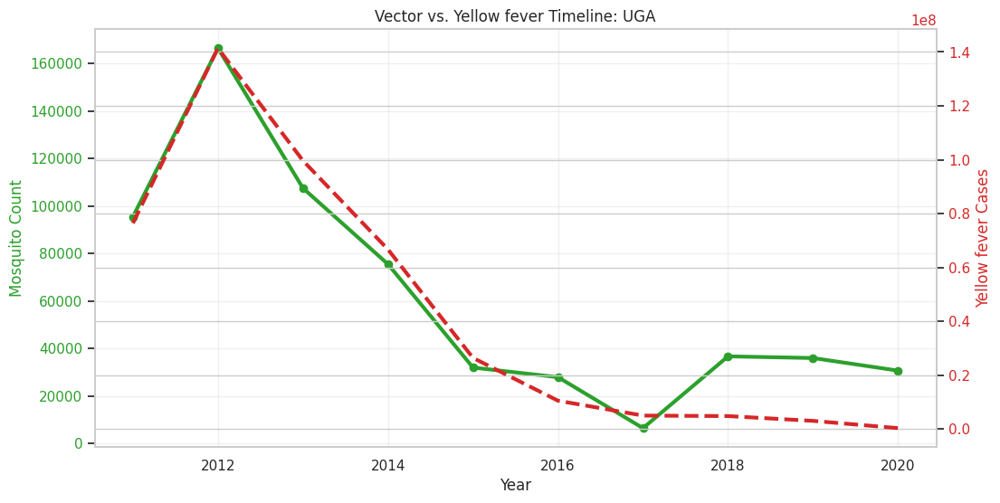

Skipping cases_Zika virus (0 cases found in UGA)


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

country_iso = 'UGA'
master_df['individualcount'] = pd.to_numeric(master_df['individualcount'], errors='coerce').fillna(0)


disease_cols = [col for col in master_df.columns if col.startswith('cases_')]

df_subset = master_df[master_df['iso_code'] == country_iso].copy()

for disease_col in disease_cols:

    df_subset[disease_col] = pd.to_numeric(df_subset[disease_col], errors='coerce').fillna(0)

    if df_subset[disease_col].sum() == 0:
        print(f"Skipping {disease_col} (0 cases found in {country_iso})")
        continue


    df_trend = df_subset.groupby('year')[['individualcount', disease_col]].sum().reset_index()


    fig, ax1 = plt.subplots(figsize=(12, 6))

    color = 'tab:green'
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Mosquito Count', color=color)
    ax1.plot(df_trend['year'], df_trend['individualcount'], color=color, linewidth=3, marker='o', label='Mosquitoes')
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.grid(True, alpha=0.3)

    ax2 = ax1.twinx()
    color = 'tab:red'

    clean_name = disease_col.replace('cases_', '')

    ax2.set_ylabel(f'{clean_name} Cases', color=color)
    ax2.plot(df_trend['year'], df_trend[disease_col], color=color, linewidth=3, linestyle='--', label=clean_name)
    ax2.tick_params(axis='y', labelcolor=color)

    plt.title(f"Vector vs. {clean_name} Timeline: {country_iso}")
    plt.show()

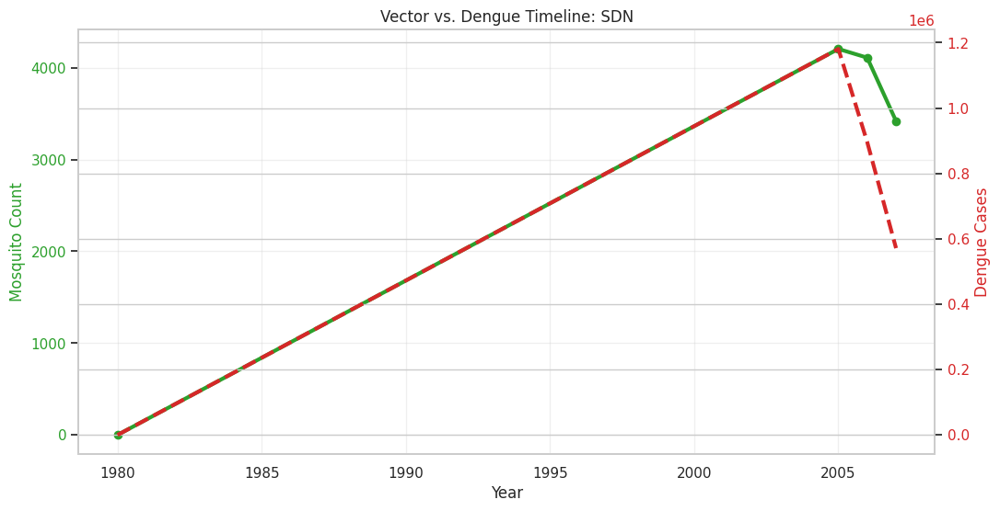

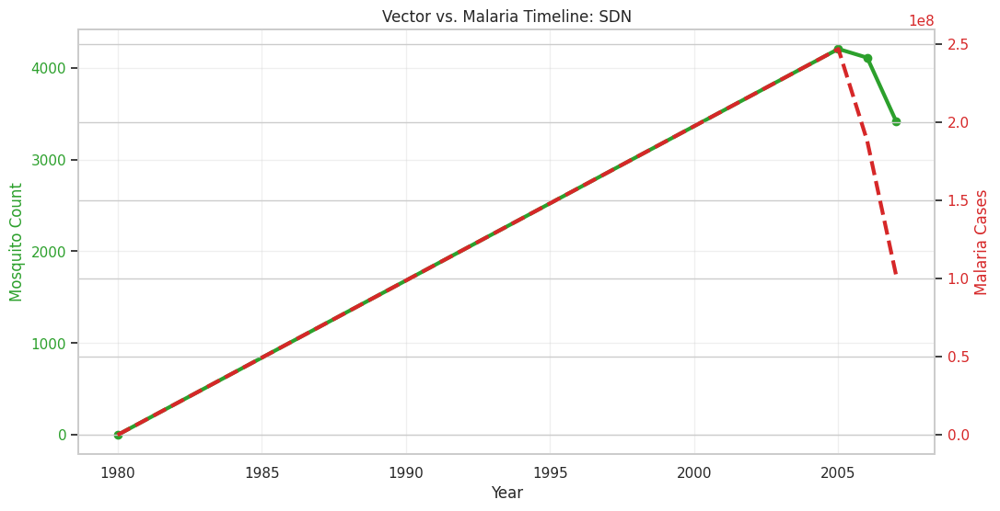

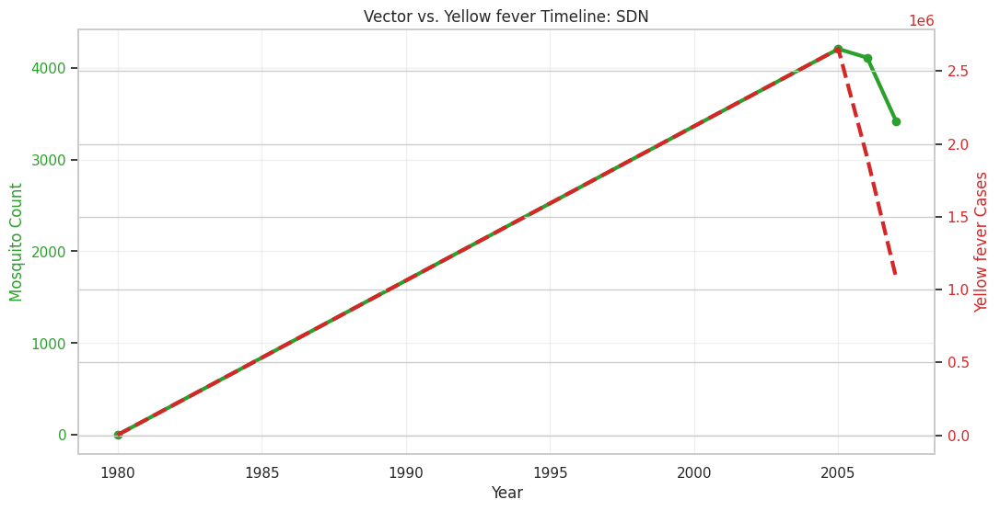

Skipping cases_Zika virus (0 cases found in SDN)


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

country_iso = 'SDN'
master_df['individualcount'] = pd.to_numeric(master_df['individualcount'], errors='coerce').fillna(0)


disease_cols = [col for col in master_df.columns if col.startswith('cases_')]

df_subset = master_df[master_df['iso_code'] == country_iso].copy()

for disease_col in disease_cols:

    df_subset[disease_col] = pd.to_numeric(df_subset[disease_col], errors='coerce').fillna(0)

    if df_subset[disease_col].sum() == 0:
        print(f"Skipping {disease_col} (0 cases found in {country_iso})")
        continue


    df_trend = df_subset.groupby('year')[['individualcount', disease_col]].sum().reset_index()


    fig, ax1 = plt.subplots(figsize=(12, 6))

    color = 'tab:green'
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Mosquito Count', color=color)
    ax1.plot(df_trend['year'], df_trend['individualcount'], color=color, linewidth=3, marker='o', label='Mosquitoes')
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.grid(True, alpha=0.3)

    ax2 = ax1.twinx()
    color = 'tab:red'

    clean_name = disease_col.replace('cases_', '')

    ax2.set_ylabel(f'{clean_name} Cases', color=color)
    ax2.plot(df_trend['year'], df_trend[disease_col], color=color, linewidth=3, linestyle='--', label=clean_name)
    ax2.tick_params(axis='y', labelcolor=color)

    plt.title(f"Vector vs. {clean_name} Timeline: {country_iso}")
    plt.show()

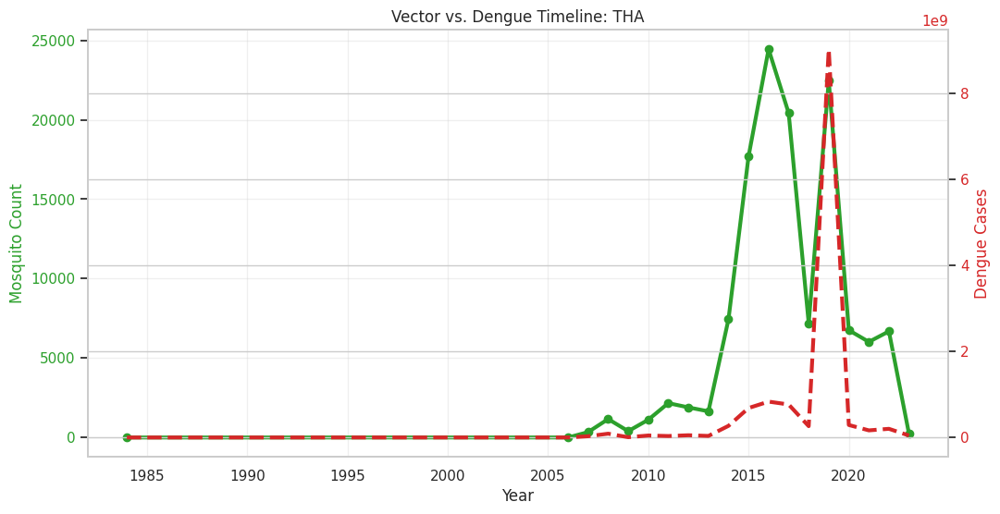

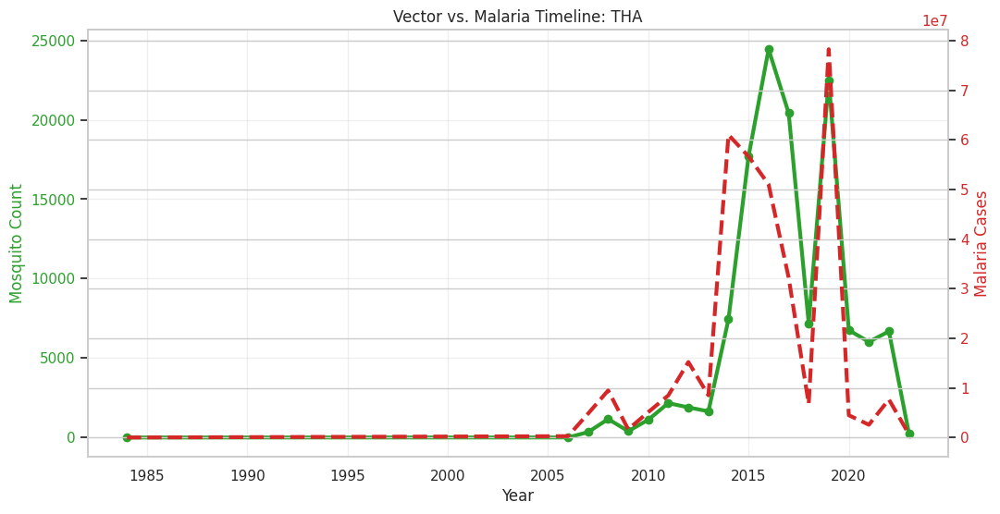

Skipping cases_Yellow fever (0 cases found in THA)


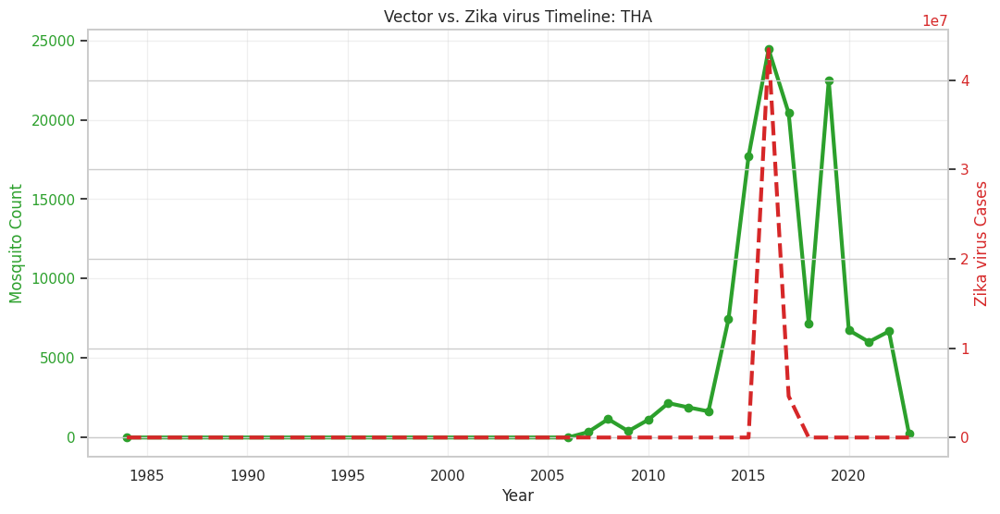

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

country_iso = 'THA'
master_df['individualcount'] = pd.to_numeric(master_df['individualcount'], errors='coerce').fillna(0)


disease_cols = [col for col in master_df.columns if col.startswith('cases_')]

df_subset = master_df[master_df['iso_code'] == country_iso].copy()

for disease_col in disease_cols:

    df_subset[disease_col] = pd.to_numeric(df_subset[disease_col], errors='coerce').fillna(0)

    if df_subset[disease_col].sum() == 0:
        print(f"Skipping {disease_col} (0 cases found in {country_iso})")
        continue


    df_trend = df_subset.groupby('year')[['individualcount', disease_col]].sum().reset_index()


    fig, ax1 = plt.subplots(figsize=(12, 6))

    color = 'tab:green'
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Mosquito Count', color=color)
    ax1.plot(df_trend['year'], df_trend['individualcount'], color=color, linewidth=3, marker='o', label='Mosquitoes')
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.grid(True, alpha=0.3)

    ax2 = ax1.twinx()
    color = 'tab:red'

    clean_name = disease_col.replace('cases_', '')

    ax2.set_ylabel(f'{clean_name} Cases', color=color)
    ax2.plot(df_trend['year'], df_trend[disease_col], color=color, linewidth=3, linestyle='--', label=clean_name)
    ax2.tick_params(axis='y', labelcolor=color)

    plt.title(f"Vector vs. {clean_name} Timeline: {country_iso}")
    plt.show()

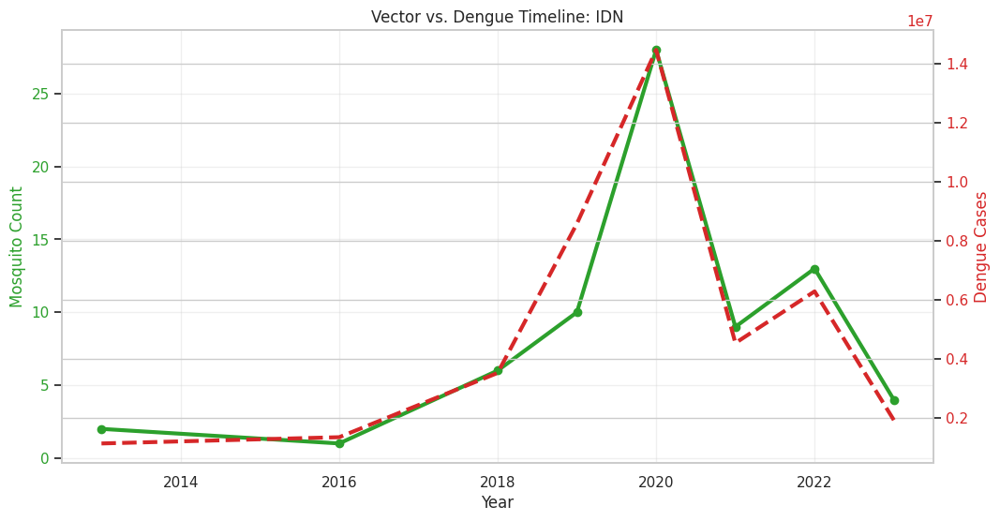

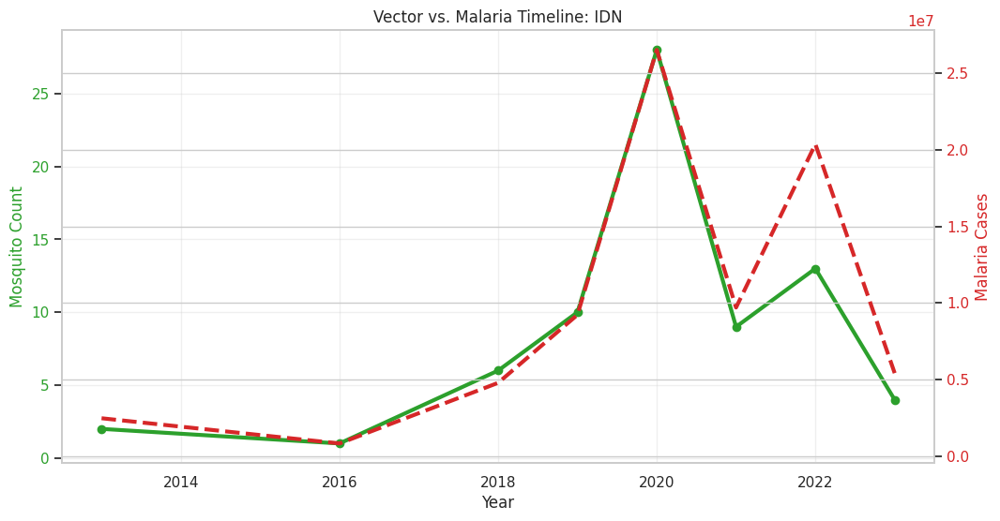

Skipping cases_Yellow fever (0 cases found in IDN)


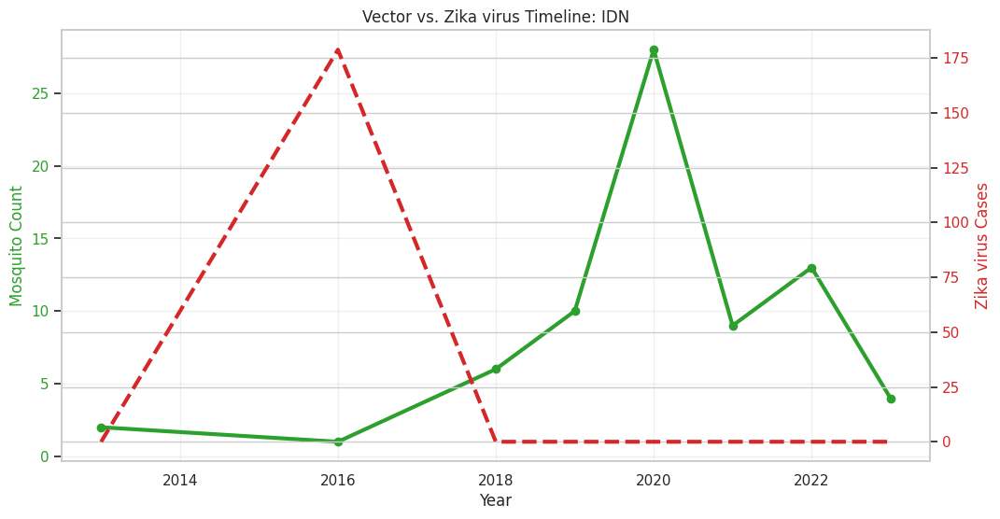

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

country_iso = 'IDN'
master_df['individualcount'] = pd.to_numeric(master_df['individualcount'], errors='coerce').fillna(0)


disease_cols = [col for col in master_df.columns if col.startswith('cases_')]

df_subset = master_df[master_df['iso_code'] == country_iso].copy()

for disease_col in disease_cols:

    df_subset[disease_col] = pd.to_numeric(df_subset[disease_col], errors='coerce').fillna(0)

    if df_subset[disease_col].sum() == 0:
        print(f"Skipping {disease_col} (0 cases found in {country_iso})")
        continue


    df_trend = df_subset.groupby('year')[['individualcount', disease_col]].sum().reset_index()


    fig, ax1 = plt.subplots(figsize=(12, 6))

    color = 'tab:green'
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Mosquito Count', color=color)
    ax1.plot(df_trend['year'], df_trend['individualcount'], color=color, linewidth=3, marker='o', label='Mosquitoes')
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.grid(True, alpha=0.3)

    ax2 = ax1.twinx()
    color = 'tab:red'

    clean_name = disease_col.replace('cases_', '')

    ax2.set_ylabel(f'{clean_name} Cases', color=color)
    ax2.plot(df_trend['year'], df_trend[disease_col], color=color, linewidth=3, linestyle='--', label=clean_name)
    ax2.tick_params(axis='y', labelcolor=color)

    plt.title(f"Vector vs. {clean_name} Timeline: {country_iso}")
    plt.show()

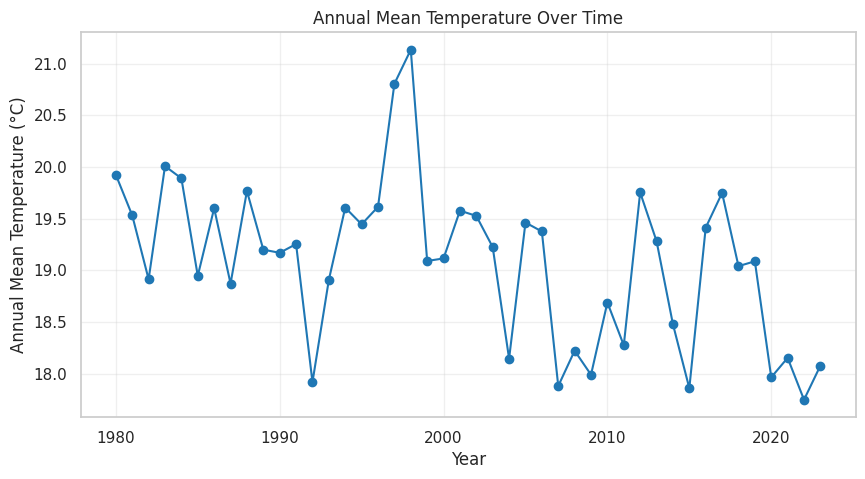

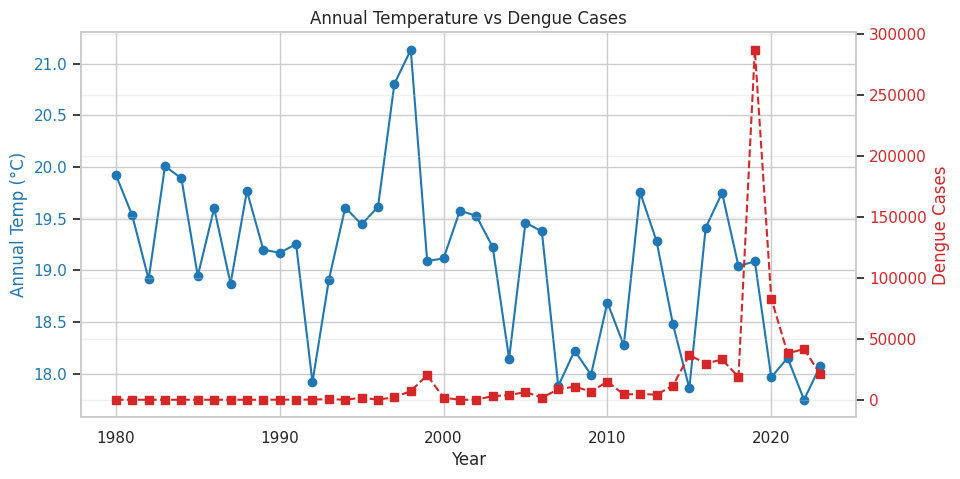

Correlation between annual temperature and Dengue cases:
              annual_temp  cases_Dengue
annual_temp          1.00         -0.16
cases_Dengue        -0.16          1.00


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# --- 1. Compute annual mean temperature ---
annual_temp = master_df.groupby('year')['monthly_temp'].mean().reset_index()
annual_temp.rename(columns={'monthly_temp':'annual_temp'}, inplace=True)

# --- 2. Merge annual temperature back into main dataset ---
df = master_df.merge(annual_temp, on='year', how='left')

# --- 3. Plot annual mean temperature trend ---
plt.figure(figsize=(10,5))
plt.plot(annual_temp['year'], annual_temp['annual_temp'], marker='o', color='tab:blue')
plt.title("Annual Mean Temperature Over Time")
plt.xlabel("Year")
plt.ylabel("Annual Mean Temperature (°C)")
plt.grid(True, alpha=0.3)
plt.show()

# --- 4. Compare annual temperature with Dengue cases (dual-axis plot) ---
df_trend = df.groupby('year')[['annual_temp','cases_Dengue']].mean().reset_index()

fig, ax1 = plt.subplots(figsize=(10,5))
ax1.set_xlabel("Year")
ax1.set_ylabel("Annual Temp (°C)", color="tab:blue")
ax1.plot(df_trend['year'], df_trend['annual_temp'], color="tab:blue", marker='o')
ax1.tick_params(axis='y', labelcolor="tab:blue")

ax2 = ax1.twinx()
ax2.set_ylabel("Dengue Cases", color="tab:red")
ax2.plot(df_trend['year'], df_trend['cases_Dengue'], color="tab:red", linestyle="--", marker='s')
ax2.tick_params(axis='y', labelcolor="tab:red")

plt.title("Annual Temperature vs Dengue Cases")
plt.grid(True, alpha=0.3)
plt.show()

# --- 5. Correlation check ---
corr = df_trend[['annual_temp','cases_Dengue']].corr()
print("Correlation between annual temperature and Dengue cases:")
print(corr)

Mosquito Disease:

Annual Agregation

**Try to build good corr**

In [ ]:
mosq_yearly = (
    df_focus
    .groupby(["iso3_code", "year"])["individualCount"]
    .sum()
    .reset_index()
)

In [ ]:
mosq_yearly["year"] = mosq_yearly["year"].astype(int)
df_incidence_deaths["year"] = df_incidence_deaths["year"].astype(int)


df_incidence_deaths = df_incidence_deaths.rename(columns={"iso3": "iso3_code"})

merged = mosq_yearly.merge(
    df_incidence_deaths,
    on=["iso3_code", "year"],
    how="inner"
)

In [ ]:
print(merged.columns.tolist())

['iso3_code', 'year', 'individualCount', 'measure', 'country', 'disease', 'case_count', 'upper', 'lower', 'who_region', 'iso_code']


In [ ]:
disease_pivot = (
    merged
    .pivot_table(
        index=["iso3_code", "year", "individualCount"],
        columns="disease",
        values="case_count",
        aggfunc="sum"
    )
    .reset_index()
)


In [ ]:
corr = disease_pivot[[
    "individualCount",
    "Dengue",
    "Malaria",
    "Yellow fever",
    "Zika virus"
]].corr()

corr


disease,individualCount,Dengue,Malaria,Yellow fever,Zika virus
disease,,,,,
individualCount,1.00,NaN,NaN,NaN,NaN
Dengue,NaN,NaN,NaN,NaN,NaN
Malaria,NaN,NaN,NaN,NaN,NaN
Yellow fever,NaN,NaN,NaN,NaN,NaN
Zika virus,NaN,NaN,NaN,NaN,NaN


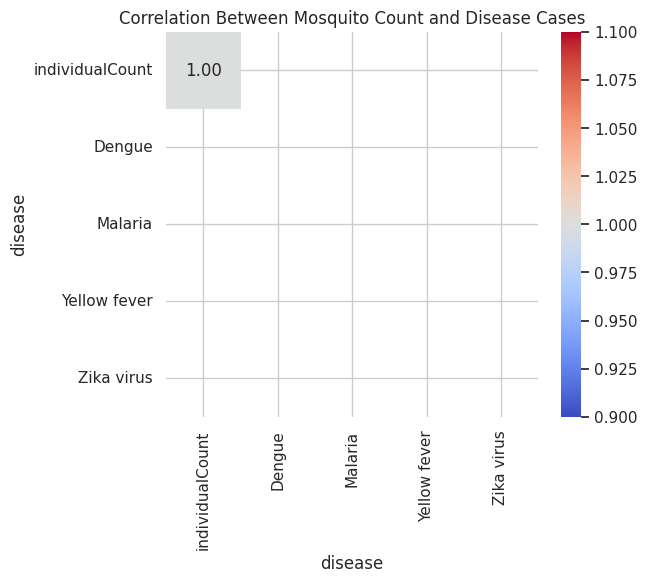

In [ ]:
plt.figure(figsize=(6,5))
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Between Mosquito Count and Disease Cases")
plt.show()


In [ ]:
final_df = (
    merged
    .groupby(["iso3_code", "year"])
    .agg({
        "individualCount": "sum",
        "case_count": "sum"
    })
    .reset_index()
)

In [ ]:
disease_pivot = (
    merged
    .groupby(["iso3_code", "year", "disease"])
    .agg({
        "individualCount": "sum",
        "case_count": "sum"
    })
    .reset_index()
    .pivot(
        index=["iso3_code", "year", "individualCount"],
        columns="disease",
        values="case_count"
    )
    .reset_index()
)

In [ ]:
disease_pivot = disease_pivot.fillna(0)

In [ ]:
corr = disease_pivot[[
    "individualCount",
    "Dengue",
    "Malaria",
    "Yellow fever",
    "Zika virus"
]].corr()

corr


disease,individualCount,Dengue,Malaria,Yellow fever,Zika virus
disease,,,,,
individualCount,1.00,NaN,NaN,NaN,NaN
Dengue,NaN,NaN,NaN,NaN,NaN
Malaria,NaN,NaN,NaN,NaN,NaN
Yellow fever,NaN,NaN,NaN,NaN,NaN
Zika virus,NaN,NaN,NaN,NaN,NaN


After aggregation and reshaping, correlations between mosquito counts and disease incidence remained weak, likely due to sparse disease reporting and temporal misalignment.

In [ ]:
print(df_mosquitos.columns)
print(df_incidence_deaths.columns)
print(temperature_df.columns)
print(percipitation_df.columns)

Index(['gbifid', 'individualcount', 'sex', 'year', 'month', 'continent',
       'countrycode', 'decimallatitude', 'decimallongitude', 'scientificname',
       'specificepithet', 'issue', 'country', 'iso3_code', 'country_name',
       'iso_code'],
      dtype='object')
Index(['measure', 'country', 'disease', 'year', 'case_count', 'upper', 'lower',
       'iso3_code', 'who_region', 'iso_code'],
      dtype='object')
Index(['country', 'code', 'month', 'year', 'temperature', 'iso_code'], dtype='object')
Index(['country', 'code', 'year', 'annual precipitation', 'iso_code'], dtype='object')


Each Dataset has its own processor

In [ ]:
df_mosquitos_clean = (
    df_mosquitos
    .groupby(['iso3_code', 'year'], as_index=False)
    .agg({
        'individualcount': 'sum'
    })
)

df_mosquitos_clean.rename(columns={
    'individualcount': 'insect_count'
}, inplace=True)


In [ ]:
df_incidence_clean = (
    df_incidence_deaths
    .groupby(['iso3_code', 'year'], as_index=False)
    .agg({
        'case_count': 'sum'
    })
)


In [ ]:
temperature_df_clean = (
    temperature_df
    .groupby(['iso_code', 'year'], as_index=False)
    .agg({
        'temperature': 'mean'
    })
)

temperature_df_clean.rename(columns={
    'iso_code': 'iso3_code',
    'temperature': 'avg_temperature'
}, inplace=True)


In [ ]:
percipitation_df_clean = percipitation_df.copy()

percipitation_df_clean.rename(columns={
    'iso_code': 'iso3_code',
    'annual precipitation': 'annual_precipitation'
}, inplace=True)


Integration

In [ ]:
df_final = (
    df_incidence_clean
    .merge(temperature_df_clean, on=['iso3_code', 'year'], how='left')
    .merge(percipitation_df_clean[['iso3_code','year','annual_precipitation']],
           on=['iso3_code', 'year'], how='left')
    .merge(df_mosquitos_clean, on=['iso3_code', 'year'], how='left')
)


Clean up missing values

In [ ]:
df_final.isna().sum()

iso3_code                  0
year                       0
case_count                 0
avg_temperature          880
annual_precipitation     880
insect_count            5884
dtype: int64

In [ ]:
#insect_count == 0 (No record ≠ nonexistence)
df_final['insect_count'].fillna(0, inplace=True)

In [ ]:
# avg_temperature == Average country
df_final['avg_temperature'] = (
    df_final
    .groupby('iso3_code')['avg_temperature']
    .transform(lambda x: x.fillna(x.mean()))
)

#annual_precipitation == Average country

df_final['annual_precipitation'] = (
    df_final
    .groupby('iso3_code')['annual_precipitation']
    .transform(lambda x: x.fillna(x.mean()))
)


In [ ]:
# If NaN (countries with no value) remained
df_final=df_final.dropna()

In [ ]:
df_final.isna().sum()

iso3_code               0
year                    0
case_count              0
avg_temperature         0
annual_precipitation    0
insect_count            0
log_cases               0
log_insects             0
temp_lag1               0
insects_lag1            0
dtype: int64

In [ ]:
df_final.shape

(1007, 10)

Normalization

In [ ]:
df_final['log_cases'] = np.log1p(df_final['case_count'])
df_final['log_insects'] = np.log1p(df_final['insect_count'])

Correlation

In [ ]:
corr = df_final[[
    'log_cases',
    'log_insects',
    'avg_temperature',
    'annual_precipitation'
]].corr()

corr

,log_cases,log_insects,avg_temperature,annual_precipitation
log_cases,1.00,-0.04,0.83,0.39
log_insects,-0.04,1.00,-0.08,-0.06
avg_temperature,0.83,-0.08,1.00,0.23
annual_precipitation,0.39,-0.06,0.23,1.00


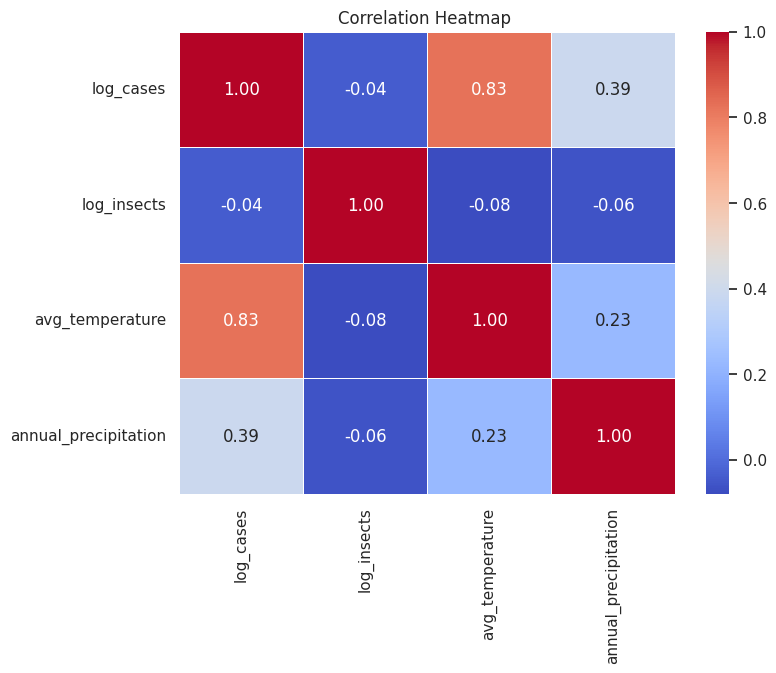

In [ ]:
features = [
    'log_cases',
    'log_insects',
    'avg_temperature',
    'annual_precipitation'
]

corr = df_final[features].corr()

plt.figure(figsize=(8,6))
sns.heatmap(
    corr,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    linewidths=0.5
)
plt.title("Correlation Heatmap ")
plt.show()


siba idea :

In [ ]:
# We filter only carrier types

vector_species = [
    'Aedes aegypti',
    'Aedes albopictus'
]

df_vectors = master_df[
    master_df['scientificname'].str.contains(
        'Aedes aegypti|Aedes albopictus|Anopheles',
        case=False,
        na=False
    )
]

We operate on a (country, year, month) level.

In [ ]:
presence_df = (
    df_vectors
    .groupby(['iso_code','year','month'])
    .size()
    .reset_index(name='records')
)

presence_df['mosquito_presence'] = 1
presence_df = presence_df[['iso_code','year','month','mosquito_presence']]


We merge presence with master_df

In [ ]:
master_df = master_df.merge(
    presence_df,
    on=['iso_code','year','month'],
    how='left'
)

master_df['mosquito_presence'].fillna(0, inplace=True)

/tmp/ipykernel_55/3483882533.py:7: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [ ]:
features = ['mosquito_presence', 'monthly_temp', 'annual_precip']

master_df[features].isna().sum()

mosquito_presence    0
monthly_temp         0
annual_precip        0
dtype: int64

In [ ]:
master_df['monthly_temp'] = (
    master_df
    .groupby('iso_code')['monthly_temp']
    .transform(lambda x: x.fillna(x.mean()))
)

In [ ]:
master_df['annual_precip'] = (
    master_df
    .groupby('iso_code')['annual_precip']
    .transform(lambda x: x.fillna(x.mean()))
)

In [ ]:
master_df['monthly_temp'].fillna(master_df['monthly_temp'].mean(), inplace=True)
master_df['annual_precip'].fillna(master_df['annual_precip'].mean(), inplace=True)

/tmp/ipykernel_55/2887734515.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



/tmp/ipykernel_55/2887734515.py:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[

In [ ]:
master_df['dengue_risk'] = (master_df['cases_Dengue'] > 0).astype(int)

In [ ]:
X = master_df[
    ['mosquito_presence', 'monthly_temp', 'annual_precip']
]

y = master_df['dengue_risk']

In [ ]:
#Logistic Regression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

model.score(X_test, y_test)

0.9381692301640376

In [ ]:
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    classification_report
)
y_pred = model.predict(X_test)

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      0.98      0.96    312704
           1       0.90      0.74      0.81     68611

    accuracy                           0.94    381315
   macro avg       0.92      0.86      0.89    381315
weighted avg       0.94      0.94      0.94    381315

